# GRAPHS

In [11]:
from graph_tool.all import sfdp_layout,graph_draw
import graph_tool as gt 
import geopandas as gpd
import networkx as nx
import momepy
import os
import time
import numpy as np
import matplotlib.pyplot as plt
mother_dir = os.chdir('..')



def graph_from_geojson(filename,node_col_front,node_col_tail,edge_col,prop_edge_col):
    '''
        Input:
            filename: string -> name.geojson
            name of node column front: string
            name of node column tail: string
            name of edge column
            name of property column
        Output:
            graph-tool graph
    '''
    gdf = gpd.read_file(filename)
    G = Graph()
    G.add_edge_list(gdf[[node_col_front,node_col_tail]].values)
    v_number_people_prop = G.new_vertex_property('int')
    G.vp['number_people'] = v_number_people_prop
    id_prop = G.new_edge_property('int')
    G.ep['id'] = id_prop
    length_prop = G.new_edge_property('float')
    G.ep['length'] = length_prop
    for v,uv in G.items():
        uv['id'] = gdf[gdf[node_col_front] == e.source()][gdf[node_col_tail] == e.target()][edge_col].values[0]
        uv['length'] = gdf[gdf[node_col_front] == e.source()][gdf[node_col_tail] == e.target()][prop_edge_col].values[0]
        v['number_people'] = np.random(1)
    return G

def _generate_uniform_distribution_nodes_in_space(number_nodes = 100, radius_city = 10,p = 0.7):  
    '''
        Generate a uniform distribution of points in a circle of radius radius_city
        Initialize postiions and distance matrix
    '''  
    from scipy.spatial import distance_matrix
    G = gt.Graph()
    nodes_r = np.random.random(number_nodes)
    nodes_costeta = 2*np.random.random(number_nodes) - 1      
    x = nodes_r*(radius_city)*nodes_costeta
    y = nodes_r*(radius_city)*np.sqrt(1-nodes_costeta**2)  
    points_in_space = np.array([x,y]).T 
    position_vertex = G.new_vertex_property('vector<double>')
    id_vertex = G.new_vertex_property('int')
    print('initializing id vertex')
    for i in range(len(x)):
        G.add_vertex()
        id_vertex[G.vertex(i)] = i
    print('initializing position vertex')
    for node_position in range(len(points_in_space)):
        position_vertex[G.vertex(node_position)] = points_in_space[node_position] 
    G.vp['position'] = position_vertex
    G.vp['id'] = id_vertex
    for i in range(number_nodes):
        for j in range(number_nodes):
            if j !=i:
                if p < np.random.rand():
                    G.add_edge(i,j)
    print('calculating distance matrix')
    distance_matrix_ = distance_matrix(points_in_space,points_in_space)
    unweighted_edge = G.new_edge_property('int')
    length_edge = G.new_edge_property('float')
    print('initializing edge properties')
    for edge in G.edges():
        length_edge[edge] = distance_matrix_[int(edge.source())][int(edge.target())]
        unweighted_edge[edge] = 1
    G.ep['length'] = length_edge
    G.ep['unweighted'] = unweighted_edge
    return G

def distribution_edges(g):
    '''
        Citation: The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Figure (1)
    '''
#    A = gt.spectral.adjacency(g)
#    print(A.getnnz())
#    list_degrees = []
#    for i in range(len(A)):
#        list_degrees.append(np.sum(A[i]))
    gt.stats.edge_hist(g,deg='unweighted')
    n,bins = np.histogram(list_degrees)
    
    plt.plot(bins[:-1],n)
    plt.xlabel('Degree')
    plt.ylabel('Number of nodes')
    plt.show()

def dimension_graph(g):
    '''
        Citation: The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Figure (2)
    '''
    
    dist_ = gt.topology.shortest_distance(g)
    diameter_ = _get_diameter_graph(dist,g)
    number_vertices = len(g.vp['id'].get_array())
    list_N_vr = np.zeros((len(g.vp['id'].get_array()),diameter_+1))
    list_r = np.arange(diameter_+1)
    for r in range(diameter_+1):
        print('r: ',r)
        for vertex in g.vertices():
            pos = np.where(dist_[vertex].a == r)
            print('pos:\n',pos)
            Nv_r = len(pos)
            list_N_vr[g.vp['id'][vertex]][r] = Nv_r
    Avg_Nv_r = np.sum(list_N_vr,axis=0)/len(g.vp['id'].get_array())
    print('avg Nv',np.shape(Avg_Nv_r),' ',Avg_Nv_r)
    print('r',np.shape(list_r),' ',list_r)
    fig,ax = plt.subplots(1,1,figsize=(12,6))
    ax.plot(list_r,Avg_Nv_r)
    ax.set_xlabel('r')
    ax.set_ylabel('$\langle N_v(r) \rangle$')
    ax.set_xscale('log')
    ax.set_yscale('log')
    plt.show()

def _get_diameter_graph(dist,g):
    '''
        Given a graph-tool graph, and already computed shortest distance ,return the diameter of the graph
    '''
    diameter_ = 0
    for vertex in g.vertices():
        for vertex_ in g.vertices():
            if dist[vertex].a[G.vp['id'][vertex_]] > diameter_:
                diameter_ = dist[vertex].a[G.vp['id'][vertex_]]
    print('diameter: ',diameter_)
    return diameter_


/home/aamad/anaconda3/envs/gt/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [12]:
print(mother_dir)
G = _generate_uniform_distribution_nodes_in_space()
print('fraction of complete graph',G.num_edges()/(G.num_vertices()*(G.num_vertices()-1)))
#pos = sfdp_layout(G)
#graph_draw(G,pos = pos,cooling_step = 1.01,epsilon = 1)
dimension_graph(G)
dist = gt.topology.shortest_distance(G)
print(dist[0].get_array())
distribution_edges(G)


None
initializing id vertex
initializing position vertex
calculating distance matrix
initializing edge properties
fraction of complete graph 0.29828282828282826


NameError: name 'dist' is not defined

# IMAGINARY NUMBERS
## .imag is 1 order of magnitude faster than np.imag

# DISTANCE MATRIX COMPUTATION
## Lesson: scipy distance is better than numpy distance [to return a distance matrix, but not by far]

In [ ]:
import numpy as np
import scipy.spatial as sp
import time
x = np.random.rand(10000)
print(np.shape(x))
y = np.random.rand(10000)
X = np.array([x,y]).T
print('shape of X: ',X.shape)
t0 = time.time()
d = sp.distance_matrix(X,X)
t1 = time.time()
print('scipy distance: ',t1-t0)
t0 = time.time()
x2 = np.sum(X**2, axis=1) # shape of (m)
y2 = np.sum(X**2, axis=1) # shape of (n)
xy = np.matmul(X, X.T)
x2 = x2.reshape(-1, 1)
dists = np.sqrt(x2 - 2*xy + y2) # (m
t1 = time.time()
print('numpy distance: ',t1-t0)

(10000,)
shape of X:  (10000, 2)
scipy distance:  0.956500768661499
numpy distance:  1.1910429000854492


/tmp/ipykernel_3022/3403174643.py:18: RuntimeWarning: invalid value encountered in sqrt
  dists = np.sqrt(x2 - 2*xy + y2) # (m


# DOWNLOADING NETWORK CITIES OF INTEREST

In [1]:
import networkx as nx
import osmnx as ox
import os
import geopandas as gpd
from shapely import intersection,box,Polygon,LineString,Point
from matplotlib import pyplot as plt
import shapely as shp
import numpy as np
import sys
import pandas as pd
from shapely.geometry import Point,Polygon,LineString
from collections import defaultdict

BO_polygon_file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/BOS/shape_files/BOS.shp'
SF_polygon_file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/SFO/shape_files/SFO.shp'
LAX_polygon_file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/LAX/shape_files/LAX.shp'
RIO_polygon_file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/RIO/shape_files/RIO.shp'
LIS_polygon_file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/LIS/shape_files/LIS.shp'
#d = gpd.read_file('/home/aamad/Desktop/phd/berkeley/data/BOS/BOSnew.shp')


# BOSTON

secondary
secondary_link
secondary
secondary
secondary
unclassified
unclassified
unclassified
secondary
secondary
secondary_link
secondary
secondary
secondary
unclassified
secondary
tertiary
secondary
tertiary
tertiary
unclassified
tertiary
secondary
secondary
secondary
secondary
secondary
secondary
secondary
secondary
secondary
secondary
secondary
secondary
tertiary
tertiary
tertiary
tertiary
tertiary
unclassified
secondary
secondary
secondary
secondary
secondary
secondary
secondary
tertiary
tertiary
tertiary
tertiary
tertiary
tertiary
tertiary
tertiary
tertiary
tertiary
tertiary
secondary
secondary
tertiary
tertiary
secondary
secondary
tertiary
secondary
tertiary
tertiary
unclassified
secondary
secondary
tertiary
tertiary
tertiary
tertiary
tertiary
secondary
secondary
tertiary
tertiary
tertiary
tertiary
secondary
primary_link
secondary
primary
primary_link
unclassified
tertiary
tertiary
tertiary
secondary
secondary
tertiary
secondary
secondary
secondary
secondary
tertiary
tertiary
te

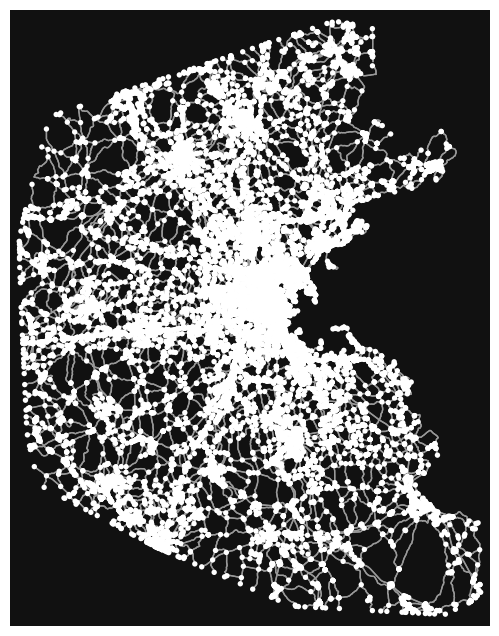

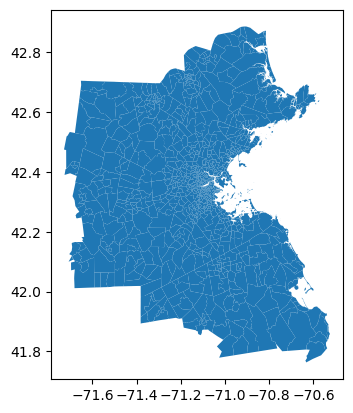

In [2]:
# SHAPE FILE: polygons covering the city
BO_polygon = gpd.read_file(BO_polygon_file)
# Cartography FROM SHAPE FILE
file_graphml = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/BOS/BOS_new_tertiary_simplified.graphml'
if os.path.isfile(file_graphml):
    BO = ox.load_graphml(file_graphml)
else:
    BO = ox.graph_from_polygon(BO_polygon.unary_union,network_type='drive', simplify=False)
for edge in BO.edges():
    print(BO[edge[0]][edge[1]][0]['highway'])
fig, ax = ox.plot_graph(BO)
BO_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/BOS/od_demand_7to8_R_1.fma'



In [91]:
BO_polygon

,tractid,my_area,geometry
0,630400,9.988907,"POLYGON ((-71.35236 41.93142, -71.35281 41.931..."
1,631100,8.289611,"POLYGON ((-71.35281 41.93117, -71.35236 41.931..."
2,631300,8.960974,"POLYGON ((-71.29017 41.94444, -71.29021 41.944..."
3,631200,17.019618,"POLYGON ((-71.30786 41.96025, -71.30804 41.959..."
4,631400,0.790492,"POLYGON ((-71.29125 41.94414, -71.29094 41.944..."
...,...,...,...
969,260700,2.537014,"POLYGON ((-71.11598 42.78340, -71.11584 42.783..."
970,260900,2.993848,"POLYGON ((-71.12079 42.76844, -71.12069 42.768..."
971,260800,0.941658,"POLYGON ((-71.09719 42.76304, -71.09696 42.764..."
972,261000,1.511648,"POLYGON ((-71.08517 42.76375, -71.08570 42.763..."


# SAN FRANCISCO

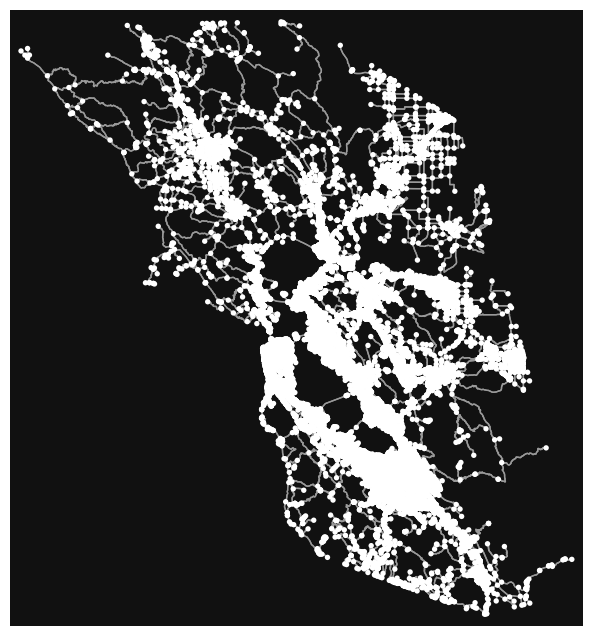

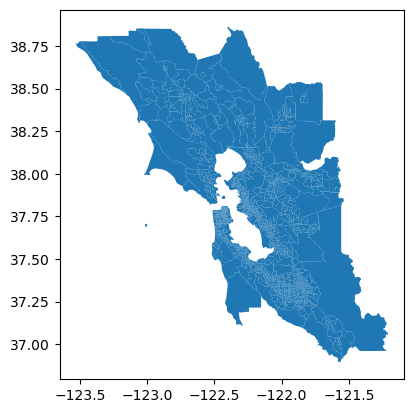

In [3]:
SF_polygon = gpd.read_file(SF_polygon_file)
file_graphml = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/SFO/SFO_new_tertiary_simplified.graphml'
if os.path.isfile(file_graphml):
    SF = ox.load_graphml(filepath = file_graphml)
else:
    SF = ox.graph_from_polygon(SF_polygon.unary_union,network_type='drive', simplify=False)
fig, ax = ox.plot_graph(SF)
SF_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/SFO/od_demand_7to8_R_1.fma'



In [ ]:
SF_polygon

,NAME,CENSUSAREA,LSAD,GEO_ID,COUNTY,STATE,TRACT,tractID,tractID_ne,geometry
0,4251.03,0.341,Tract,1400000US06001425103,001,06,425103,06001425103,1,"POLYGON ((-122.29236 37.84936, -122.28956 37.8..."
1,4251.04,0.415,Tract,1400000US06001425104,001,06,425104,06001425104,2,"POLYGON ((-122.27860 37.82854, -122.27806 37.8..."
2,4261,1.155,Tract,1400000US06001426100,001,06,426100,06001426100,3,"POLYGON ((-122.22808 37.83303, -122.22449 37.8..."
3,4271,0.396,Tract,1400000US06001427100,001,06,427100,06001427100,4,"POLYGON ((-122.22993 37.76006, -122.22969 37.7..."
4,4278,0.321,Tract,1400000US06001427800,001,06,427800,06001427800,5,"POLYGON ((-122.26353 37.76924, -122.26360 37.7..."
...,...,...,...,...,...,...,...,...,...,...
1580,4403.04,0.378,Tract,1400000US06001440304,001,06,440304,06001440304,1581,"POLYGON ((-122.08120 37.58757, -122.08118 37.5..."
1581,3892,0.096,Tract,1400000US06013389200,013,06,389200,06013389200,1582,"POLYGON ((-122.30618 37.89822, -122.30695 37.9..."
1582,4506.04,0.816,Tract,1400000US06001450604,001,06,450604,06001450604,1583,"POLYGON ((-121.87815 37.68889, -121.87784 37.6..."
1583,123.02,0.036,Tract,1400000US06075012302,075,06,012302,06075012302,1584,"POLYGON ((-122.40987 37.78715, -122.41297 37.7..."


# RIO

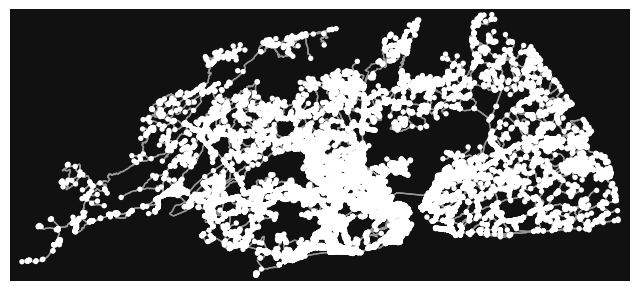

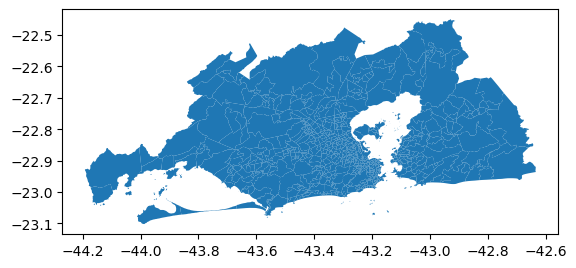

In [4]:
RIO_polygon = gpd.read_file(RIO_polygon_file)
file_graphml = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/RIO/RIO_new_tertiary_simplified.graphml'
if os.path.isfile(file_graphml):
    RIO = ox.load_graphml(filepath = file_graphml)
else:
    RIO = ox.graph_from_polygon(SF_polygon.unary_union,network_type='drive', simplify=False)
fig, ax = ox.plot_graph(RIO)
RIO_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/RIO/od_demand_7to8_R_1.fma'



In [ ]:
RIO_polygon

,Zona,Area,geometry
0,1.0,0.431999,"POLYGON ((-43.18728 -22.89789, -43.18726 -22.8..."
1,10.0,0.517468,"POLYGON ((-43.18348 -22.92862, -43.18338 -22.9..."
2,100.0,3.157796,"POLYGON ((-43.20465 -22.96343, -43.20419 -22.9..."
3,101.0,0.531223,"POLYGON ((-43.20136 -22.96076, -43.20101 -22.9..."
4,102.0,0.328147,"POLYGON ((-43.20424 -22.96031, -43.20412 -22.9..."
...,...,...,...
725,95.0,0.469361,"POLYGON ((-43.20699 -22.98253, -43.20702 -22.9..."
726,96.0,0.463444,"POLYGON ((-43.22165 -22.98824, -43.22210 -22.9..."
727,97.0,0.468069,"POLYGON ((-43.22524 -22.98061, -43.22505 -22.9..."
728,98.0,0.612884,"POLYGON ((-43.21945 -22.97675, -43.21909 -22.9..."


# LAX

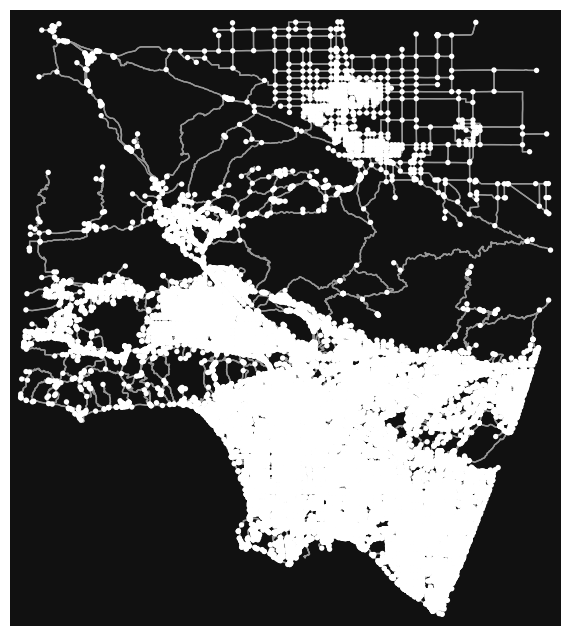

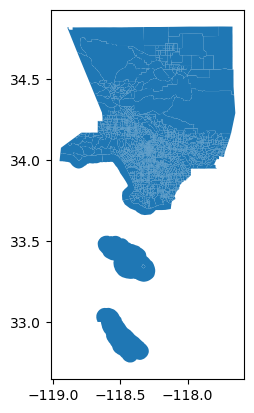

In [5]:
LAX_polygon = gpd.read_file(LAX_polygon_file)
file_graphml = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/LAX/LAX_new_tertiary_simplified.graphml'
if os.path.isfile(file_graphml):
    LAX = ox.load_graphml(filepath = file_graphml)
else:
    LAX = ox.graph_from_polygon(LAX_polygon.unary_union,network_type='drive', simplify=False)
fig, ax = ox.plot_graph(LAX)
LAX_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/LAX/od_demand_7to8_R_1.fma'



In [ ]:
LAX_polygon

,slug,set,kind,external_i,name,display_na,INTPTLAT,NAME_1,INTPTLON,FUNCSTAT,GEOID,AWATER,COUNTYFP,NAMELSAD,MTFCC,TRACTCE,STATEFP,ALAND,geometry
0,06037101110-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037101110,1011.10,06037101110 Census Tract (2012),+34.2594737,None,-118.2929869,S,06037101110,0,037,Census Tract 1011.10,G5020,101110,06,1142405,"POLYGON ((-118.30229 34.25870, -118.30079 34.2..."
1,06037101122-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037101122,1011.22,06037101122 Census Tract (2012),+34.2677213,None,-118.2901465,S,06037101122,0,037,Census Tract 1011.22,G5020,101122,06,2644042,"POLYGON ((-118.30333 34.27354, -118.30318 34.2..."
2,06037101210-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037101210,1012.10,06037101210 Census Tract (2012),+34.2529724,None,-118.2907309,S,06037101210,0,037,Census Tract 1012.10,G5020,101210,06,650691,"POLYGON ((-118.29945 34.25598, -118.28592 34.2..."
3,06037101220-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037101220,1012.20,06037101220 Census Tract (2012),+34.2516085,None,-118.2816322,S,06037101220,0,037,Census Tract 1012.20,G5020,101220,06,698969,"POLYGON ((-118.28592 34.24896, -118.28592 34.2..."
4,06037101300-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037101300,1013,06037101300 Census Tract (2012),+34.2487732,None,-118.2709976,S,06037101300,0,037,Census Tract 1013,G5020,101300,06,2581129,"POLYGON ((-118.27247 34.23253, -118.27194 34.2..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2341,06037980031-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037980031,9800.31,06037980031 Census Tract (2012),+33.7338344,None,-118.2627274,S,06037980031,13318970,037,Census Tract 9800.31,G5020,980031,06,12598244,"POLYGON ((-118.28530 33.70860, -118.28337 33.7..."
2342,06037980033-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037980033,9800.33,06037980033 Census Tract (2012),+33.7443155,None,-118.2203101,S,06037980033,16041385,037,Census Tract 9800.33,G5020,980033,06,12678792,"POLYGON ((-118.24463 33.71077, -118.23180 33.7..."
2343,06037990100-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037990100,9901,06037990100 Census Tract (2012),+33.9991909,None,-118.7921876,S,06037990100,172776519,037,Census Tract 9901,G5020,990100,06,0,"POLYGON ((-118.95114 33.99643, -118.95056 34.0..."
2344,06037990200-census-tract-2012,Census Tracts (2012),Census Tract (2012),06037990200,9902,06037990200 Census Tract (2012),+33.9135868,None,-118.4928693,S,06037990200,207469766,037,Census Tract 9902,G5020,990200,06,0,"POLYGON ((-118.63168 34.00001, -118.63598 34.0..."


# LIS

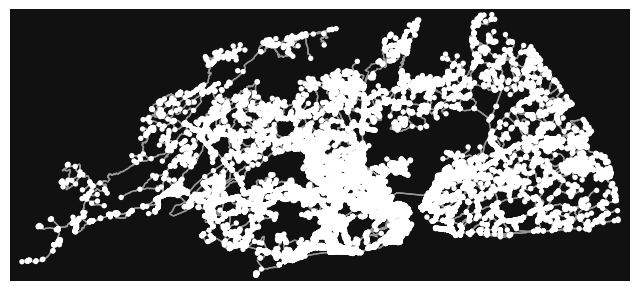

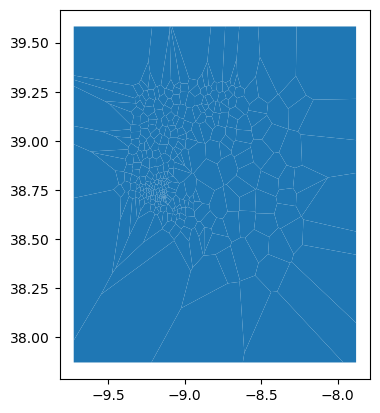

In [6]:
LIS_polygon = gpd.read_file(LIS_polygon_file)
file_graphml = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/LIS/LIS_new_tertiary_simplified.graphml'
if os.path.isfile(file_graphml):
    LIS = ox.load_graphml(filepath = file_graphml)
else:
    LIS = ox.graph_from_polygon(SF_polygon.unary_union,network_type='drive', simplify=False)
fig, ax = ox.plot_graph(RIO)
LIS_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/LIS/od_demand_7to8_R_1.fma'



# MAPPING 

In [67]:
import multiprocessing as mp
import time
import sys
sys.path.append('/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/scripts/ServerCommunication')
from HostConnection import *
def sum(arguments):
    return np.sum(arguments)
def main(arguments, output_queue):
    # 1) Do something with arguments.
    # For example, simulate a long computation
    sum(arguments)
    print(' pid: ',os.getpid(),' time 1st function: ',time.time()-t0)
    time.sleep(1)

    # 2) Connect to the server, send files, and launch simulation.
    # Dummy output to simulate completion of step 2
    output = f"Output for {arguments}"
    output_queue.put(output)


def run_parallel(arguments_list):
    with mp.Manager() as manager:
        output_queue = manager.Queue()

        with mp.Pool() as pool:
            results = []
            for arguments in arguments_list:
                # Map the function to the arguments in parallel
                result = pool.apply_async(main, (arguments, output_queue))
                print(' pid: ',os.getpid(),' result: ',result)
                results.append(result)

            # Wait for all processes to finish
            for result in results:
                result.get()
                print(' pid: ',os.getpid(),' Dt: ',time.time()-t0)
        # Retrieve outputs from the shared output_queue
        outputs = []
        while not output_queue.empty():
            outputs.append(output_queue.get())
    return outputs

# Example arguments
arguments_list = [(np.arange(0,100000000)), (np.arange(1,100000000)), (np.arange(2,100000000)), (np.arange(3,100000000)), (np.arange(4,100000000))]
t0 = time.time()
# Run the processes in parallel
outputs = run_parallel(arguments_list)

print("Outputs:", outputs)



 pid:  83629  result:  <multiprocessing.pool.ApplyResult object at 0x7f12ea35bfd0>
 pid:  83629  result:  <multiprocessing.pool.ApplyResult object at 0x7f12f339d510>
 pid:  83629  result:  <multiprocessing.pool.ApplyResult object at 0x7f12f339c110>
 pid:  83629  result:  <multiprocessing.pool.ApplyResult object at 0x7f12f339f010>
 pid:  83629  result:  <multiprocessing.pool.ApplyResult object at 0x7f12f339d410>
 pid:  83629  Dt:  3.0064117908477783
 pid:  83629  Dt:  5.12888240814209
 pid:  83629  Dt:  5.8911826610565186
 pid:  83629  Dt:  7.301025390625
 pid:  83629  Dt:  8.915284633636475
Outputs: ['Output for [       0        1        2 ... 99999997 99999998 99999999]', 'Output for [       1        2        3 ... 99999997 99999998 99999999]', 'Output for [       2        3        4 ... 99999997 99999998 99999999]', 'Output for [       3        4        5 ... 99999997 99999998 99999999]', 'Output for [       4        5        6 ... 99999997 99999998 99999999]']


In [68]:
TRAFFIC_DIR = os.getenv('TRAFFIC_DIR')  
os.listdir(os.path.join(TRAFFIC_DIR,'data','shape_files'))

['bra_ppp_2020_UNadj_constrained.tif',
 'usa_ppp_2020_UNadj_constrained.tif',
 'prt_ppp_2020_UNadj_constrained.tif']

In [ ]:
#SF = ox.graph_from_place("San Francisco, California, USA", network_type="drive")
SF_polygon = gpd.read_file(SF_polygon_file)
cg = 0
for g in SF_polygon.geometry:
    if cg%100 == 0:
        print('main cycle: ',cg)
    cg1 = 0
    for g1 in SF_polygon.geometry:
        if cg<cg1:
            g_int = g.intersection(g1)
            if type(g_int) == Polygon and g_int.is_empty == False:
                print('g_int: ',g_int)
                print('intersection Area: {0},{1} '.format(cg,cg1),g_int.area())
                fig, ax = ox.plot_graph(g_int,xlabel = 'longitude',ylabel = 'latitude',title = 'intersection',show = True)
                fig, ax = ox.plot_graph(g,xlabel = 'longitude',ylabel = 'latitude',title = '{}'.format(cg),show = True)
                fig, ax = ox.plot_graph(g1,xlabel = 'longitude',ylabel = 'latitude',title = '{}'.format(cg1),show = True)
                plt.show()
        cg1 += 1
        if cg1%1000 == 0:
            print('cg1: ',cg1)

    cg += 1
#fig, ax = ox.plot_graph(SF)
#SF_polygon.plot(ax=ax, facecolor='none', edgecolor='red')
print(len(SF_polygon))

main cycle:  0
cg1:  1000
main cycle:  1
cg1:  1000
main cycle:  2
cg1:  1000
main cycle:  3
cg1:  1000
main cycle:  4
cg1:  1000
main cycle:  5
cg1:  1000
main cycle:  6
cg1:  1000
main cycle:  7
cg1:  1000
main cycle:  8
cg1:  1000
main cycle:  9
cg1:  1000
main cycle:  10
cg1:  1000
main cycle:  11
cg1:  1000
main cycle:  12
cg1:  1000
main cycle:  13
cg1:  1000
main cycle:  14
cg1:  1000
main cycle:  15
cg1:  1000
main cycle:  16
cg1:  1000
main cycle:  17
cg1:  1000
main cycle:  18
cg1:  1000
main cycle:  19
cg1:  1000
main cycle:  20
cg1:  1000
main cycle:  21
cg1:  1000
main cycle:  22
cg1:  1000
main cycle:  23
cg1:  1000
main cycle:  24
cg1:  1000
main cycle:  25
cg1:  1000
main cycle:  26
cg1:  1000
main cycle:  27
cg1:  1000
main cycle:  28
cg1:  1000
main cycle:  29
cg1:  1000
main cycle:  30
cg1:  1000
main cycle:  31
cg1:  1000
main cycle:  32
cg1:  1000
main cycle:  33
cg1:  1000
main cycle:  34
cg1:  1000
main cycle:  35
cg1:  1000
main cycle:  36
cg1:  1000
main cycle:

In [ ]:
def plot_pointinpolygon(gdf,containing_polygon,SF,node):
    fig,ax = plt.subplots(1,1,figsize=(10,10))
    gdf.loc[gdf[containing_polygon].index].plot(ax = ax,figsize=(10,10),color = 'red',edgecolor = 'black',alpha = 0.5)
    ax.scatter(SF.nodes[node]['x'],SF.nodes[node]['y'])
    ax.set_xlabel('longitude')
    ax.set_ylabel('latitude')
    ax.set_title('Node in polygon: {}'.format(gdf[containing_polygon].index))    
    plt.show()
    print('idx_containing_polygon: ',idx_containing_polygon)

## CARTOGRAPHY and SHAPEFILE REQUIRED
#SF = ox.graph_from_place("San Francisco, California, USA", network_type="drive")
#gdf = gpd.read_file(SF_polygon_file)
## FUNCION
from collections import defaultdict
polygon2origindest = defaultdict(list)
possiblekeys = ['tractID','tractid','TRACTID','tract_id','tract_ID','TRACT_ID','TRACTCE']
for node in SF.nodes():
    containing_polygon = gdf.geometry.apply(lambda x: x.contains(Point(SF.nodes[node]['x'],SF.nodes[node]['y'])))
    idx_containing_polygon = gdf[containing_polygon].index
    found_key = False
    for key in possiblekeys:
        if key in gdf.columns:
            found_key = True
            break
    if found_key:
        tract_id = gdf.loc[idx_containing_polygon][key]
    else:
        raise KeyError('No key found in: ',gdf.columns)
    if len(tract_id)==1: 
        tract_id = tract_id.tolist()[1]
        polygon2origindest[tract_id].append(node)
    elif len(tract_id)>1:
        print('found polygon: ',idx_containing_polygon)
        print('tract_id: ',tract_id)
        print('type tract_id: ',type(tract_id))
        print('values dict: ',polygon2origindest[tract_id])
        print('dict: ',polygon2origindest)
        plot_pointinpolygon(gdf,containing_polygon,SF,node)

        raise ValueError('more than one tract id: THIS IS STRANGE')
    else:
        pass


found polygon:  Index([1038], dtype='int64')
tract_id:  6075061500
type tract_id:  <class 'pandas.core.series.Series'>


/tmp/ipykernel_270667/273856847.py:29: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('tract_id: ',int(tract_id))


TypeError: unhashable type: 'Series'

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

alphas = np.linspace(0,10,10)
taus = np.linspace(0,1,10)
t = np.linspace(0,1,100)
p_t_tau = (1/tau)*np.exp(-(t/tau))
fig,ax = plt.subplots(1,1,figsize=(10,10))
for alpha in alphas:
    for tau in taus:
        p_tau = 1/tau**alpha
        Z_tau_alpha = np.sum(p_t_tau*p_tau)
        p_t_and_tau = p_t_tau*p_tau/Z_tau_alpha
        ax.plot(t,p_t_and_tau)
ax.set_xlabel('t')
ax.set_ylabel('$p(t,\tau)$')    
ax.legend(alphas)
plt.show()

/tmp/ipykernel_270667/2042909579.py:7: RuntimeWarning: divide by zero encountered in divide
  p_t_tau = (1/tau)*np.exp(-(t/tau))


ValueError: operands could not be broadcast together with shapes (100,) (10,) 

In [ ]:
import rasterio
from rasterio.plot import show
from rasterio.windows import Window
from rasterio.mask import mask
import h3
import shapely.geometry as sg
import geopandas as gpd
import numpy as np
# Function to aggregate population data for each hexagon

def aggregate_population(hexagon, hexagon_transform, clipped_data):
    # Convert hexagon to pixel coordinates
    hexagon_coords = np.array(hexagon.exterior.xy).T
    hexagon_pixel_coords = np.array(rasterio.transform.rowcol(hexagon_transform, hexagon_coords[:, 0], hexagon_coords[:, 1]))
    # Ensure coordinates are within valid bounds
    valid_coords = (
        (0 <= np.array(hexagon_pixel_coords[0])) & (np.array(hexagon_pixel_coords[0]) < clipped_data.shape[1]) &
        (0 <= np.array(hexagon_pixel_coords[1])) & (np.array(hexagon_pixel_coords[1]) < clipped_data.shape[2])
    )

    # Filter valid coordinates
    valid_pixel_coords = hexagon_pixel_coords[:, valid_coords]

    # Extract values from clipped data
    values = clipped_data[0, valid_pixel_coords[0], valid_pixel_coords[1]]

    # Aggregate population data (example: sum)
    population_sum = np.sum(values)

    return population_sum

# Replace 'path/to/your/file.tif' with the actual path to your GeoTIFF file
file_path = '/home/aamad/Desktop/phd/berkeley/data/usa_ppp_2020_UNadj_constrained.tif'
bay_area_gdf = gpd.read_file('/home/aamad/Desktop/phd/berkeley/data/BOS/BOS.shp')

#roi_window = Window(col_off=1000, row_off=5000, width=1000, height=1000)

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read raster data
    clipped_data, clipped_transform = mask(dataset, bay_area_gdf.geometry, crop=True)
clipped_data = np.array(clipped_data)
condition = clipped_data<0
clipped_data[condition] = 0

# Define hexagon resolution (adjust based on your requirements)
resolution = 8
bay_area_geometry = bay_area_gdf.unary_union

# Convert MultiPolygon to a single Polygon
bay_area_polygon = bay_area_geometry.convex_hull

# Convert Polygon to a GeoJSON-like dictionary
bay_area_geojson = sg.mapping(bay_area_polygon)
# Get hexagons within the bay area
hexagons = h3.polyfill(bay_area_geojson, resolution, geo_json_conformant=True)

# Convert hexagons to Shapely geometries
hexagon_geometries = [sg.Polygon(h3.h3_to_geo_boundary(h, geo_json=True)) for h in hexagons]


# Aggregate population data for each hexagon
population_data_hexagons = [aggregate_population(hexagon, clipped_transform, clipped_data) for hexagon in hexagon_geometries]



[0.00562074 0.00564444 0.00560091 ... 0.00565651 0.00565549 0.00566499]


/tmp/ipykernel_4631/2821436777.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  areas = gdf.area


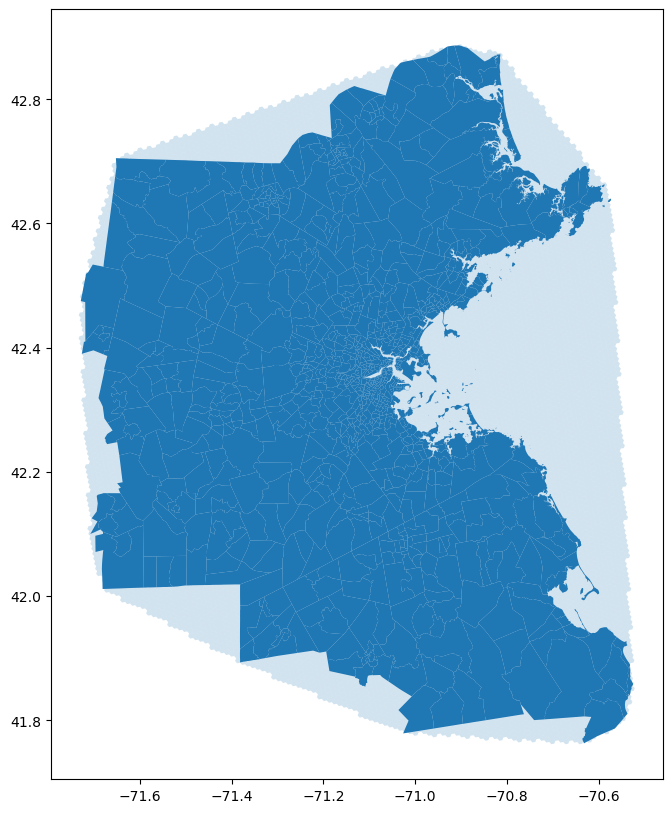

In [ ]:
fig,ax = plt.subplots(1,1,figsize=(10,10))
gpd.GeoDataFrame(geometry = hexagon_geometries,crs ="EPSG:4326").plot(ax = ax,alpha = 0.2)
gdf = gpd.GeoDataFrame(geometry = hexagon_geometries,crs ="EPSG:4326")
bay_area_gdf.plot(ax = ax)
#gdf = gdf.to_crs(epsg=4326,inplace=True)
areas = gdf.area
side_length_km = (np.array(areas) * 2 / (3 * (3**0.5)))**0.5
print(side_length_km)

In [ ]:
edge_length_at_equator = h3.edge_length(8, unit="km")
def hexagon_area(side_length):
    return (3 *np.sqrt(3) / 2) * (side_length ** 2)
print(hexagon_area(edge_length_at_equator))


0.5529957007229654


(-122.20807493456508, 37.25016875691537)
(-122.21397227028571, 37.25134284921546)
(-122.2154056765059, 37.25606141910635)
(-122.21094140866563, 37.259606083548526)
(-122.20504352796014, 37.25843205829162)
(-122.20361046012734, 37.253713301559266)
(-122.20807493456508, 37.25016875691537)


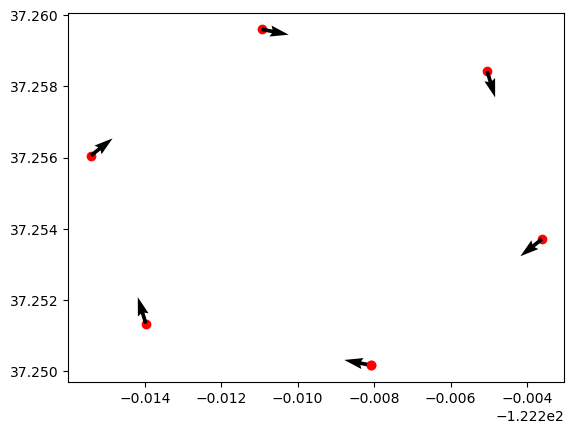

In [ ]:
boundary = gdf_hexagons.loc[0]['geometry'].convex_hull.boundary.coords.xy
bounds_pointsdim = list(zip(boundary[0],boundary[1]))
for i,point in enumerate(bounds_pointsdim):
    print(point)
    plt.scatter(point[0],point[1],color = 'red')
    if i > 0:
        plt.quiver(bounds_pointsdim[i-1][0],bounds_pointsdim[i-1][1],bounds_pointsdim[i][0]-bounds_pointsdim[i-1][0],bounds_pointsdim[i][1]-bounds_pointsdim[i-1][1])

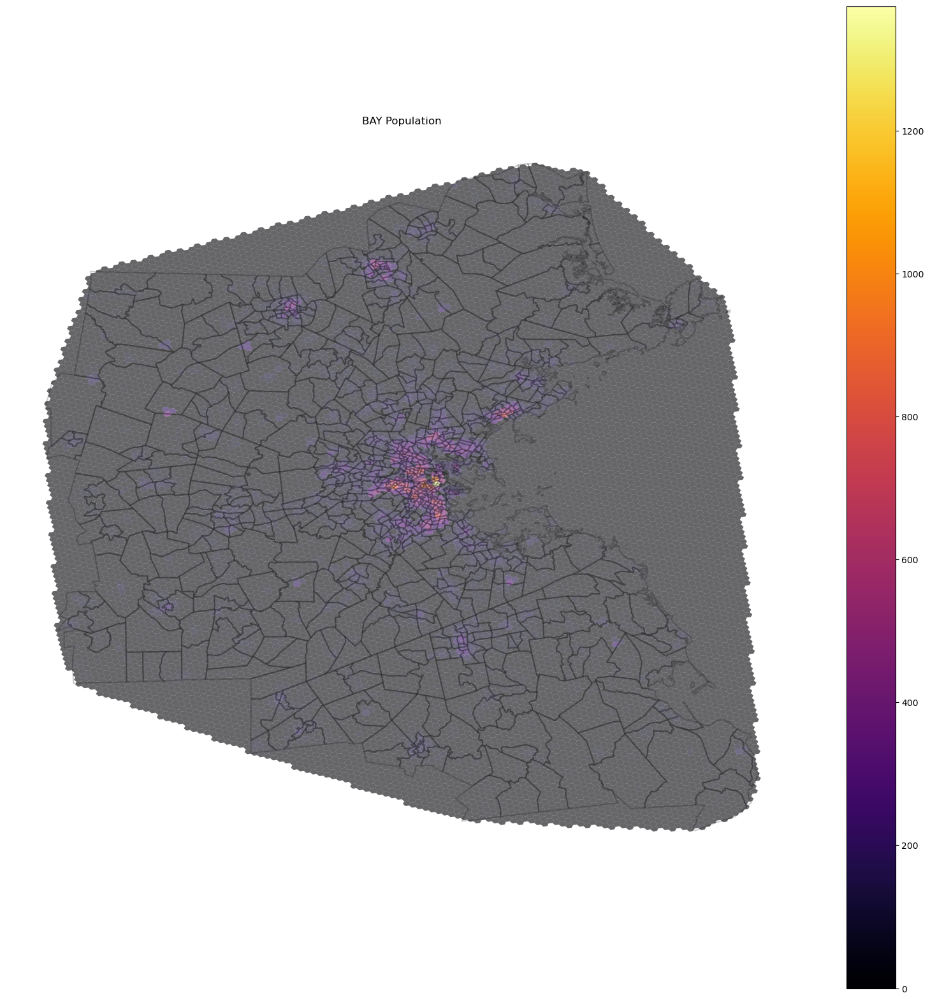

In [ ]:
fig,ax = plt.subplots(1,1,figsize=(20,20))
gdf_hexagons = gpd.GeoDataFrame(geometry=hexagon_geometries, data=population_data_hexagons, columns=['population'])
gdf_hexagons.reset_index(inplace=True)
bay_area_gdf.boundary.plot(ax = ax,alpha = 0.2,color = 'black')
gdf_hexagons.loc[:,('population','geometry')].plot(ax=ax, column='population',legend=True,alpha = 0.6,cmap = 'inferno')
ax.axis('off')
ax.set_title('BAY Population')
plt.show()


In [ ]:
def OD2matrix(df_od):
    '''
        Create: 
            1) 02mapidxorigin {0:origin1,1:origin2,...}
            2) 02mapidxdestination {0:destination1,1:destination2,...}
            3) mapidx2origin {origin1:0,origin2:1,...}
            4) mapidx2destination {destination1:0,destination2:1,...}
            origin_i,destination_i are the nominative of self.gdf_polygons
    '''
    origins = np.unique(df_od['origin'].to_numpy())
    destinations = np.unique(df_od['destination'].to_numpy())
    mapOD = df_od.groupby('origin')['destination'].unique().apply(lambda x: x[0]).to_dict()
    zero2mapidxorigin = {i:idx for idx,i in enumerate(origins)}
    zero2mapidxdestination = {i:idx for idx,i in enumerate(destinations)}
    mapidx2origin = {idx:i for idx,i in enumerate(origins)}
    mapidx2destination = {idx:i for idx,i in enumerate(destinations)}
    dimensionality_matrix = (len(origins),len(destinations))
    matrix_OD = np.zeros(dimensionality_matrix)
    print('OD: ',np.shape(matrix_OD))
    trips_OD = df_od.groupby(['origin']).count()['destination'].to_numpy(dtype= int)
    print('Origin destination couples: ',np.shape(trips_OD))
    for idx in range(len(origins)):
            matrix_OD[zero2mapidxorigin[origins[idx]],zero2mapidxdestination[mapOD[origins[idx]]]] = trips_OD[idx]
    print('matrix OD:\n',matrix_OD)
    matrix_out = np.sum(matrix_OD,axis=1)
    print('matrix_out:\n',matrix_out)
    matrix_in = np.sum(matrix_OD,axis=0)
    print('matrix_in:\n',matrix_in)
    return matrix_OD,matrix_out,matrix_in,zero2mapidxorigin,zero2mapidxdestination,mapidx2origin,mapidx2destination

In [ ]:
import pandas as pd
import osmnx as ox
import matplotlib.cm as cm


OD_ti_BO = pd.read_csv('/home/aamad/Desktop/phd/berkeley/data/carto/BOS/od_demand_7to8_R_1.csv')
gdf_polygons = gpd.read_file('/home/aamad/Desktop/phd/berkeley/data/carto/BOS/shape_files/BOS.shp')
gdf_polygons['centroid'] = gdf_polygons.centroid

fluxes_matrix,matrix_out,matrix_in,zero2mapidxorigin,zero2mapidxdestination,mapidx2origin,mapidx2destination = OD2matrix(OD_ti_BO)

G_centroid = nx.Graph()
for index, row in gdf_polygons.iterrows():
    G_centroid.add_node(index, pos=row['centroid'].coords[0])
for i in range(len(fluxes_matrix)):
    for j in range(len(fluxes_matrix[0])):
        if i != j and fluxes_matrix[i][j] != 0:
            G_centroid.add_edge(i, j, flux=fluxes_matrix[i][j])

node_positions = {node: G_centroid.nodes[node]['pos'] for node in G_centroid.nodes() if 'pos' in G_centroid.nodes[node].keys()}
G_centroid.remove_nodes_from([node for node in G_centroid.nodes() if 'pos' not in G_centroid.nodes[node].keys()])
flux_values = nx.get_edge_attributes(G_centroid, 'flux').values()
flux_min, flux_max = min(flux_values), max(flux_values)

# Draw edges with colormap based on flux values
nx.draw(G_centroid, node_positions, with_labels=False, font_weight='bold', node_size=2, edge_color=list(flux_values), edge_cmap=plt.cm.viridis, edge_vmin=flux_min, edge_vmax=flux_max)

#plt.colorbar(cmap=cm.jet,vmin = flux_min, vmax = flux_max) 
# Example: Creating a random graph (replace with your graph creation logic)
G = ox.load_graphml(filepath='/home/aamad/Desktop/phd/berkeley/data/carto/BOS/BOS_new_tertiary_simplified.graphml')
# Get the coordinates from the pos dictionary
node_positions = {node: (G.nodes[node]['x'],G.nodes[node]['y']) for node in G.nodes()}
# Plot background GeoPandas map
ax = gdf_polygons.plot(figsize=(10, 6), color='lightgrey', edgecolor='k')

# Plot the graph on top of the background map
nx.draw(G, pos=node_positions, node_size=1, node_color='blue', with_labels=False, font_color='white', font_size=0.1, ax=ax)

# Show the plot
plt.show()


(array([ 3.13618956e+03, -4.53009081e-01]), array([[ 3.00903581e+05, -2.01662497e+01],
       [-2.01662497e+01,  2.96407890e-03]]))
powerlaw fit:  3136.189558566751   -0.45300908105028365
Convergence fit powerlaw:  False
Optimal parameters:  [ 3.13621252e+03 -4.53010626e-01]
Message:  Desired error not necessarily achieved due to precision loss.
(array([3.66573001e+03, 2.44842009e-02]), array([[5.35159801e+04, 3.56758944e-01],
       [3.56758944e-01, 5.40129718e-06]]))
expo fit:  3665.730011544659   0.024484200913349588
Convergence fit expo:  False
Optimal parameters:  [1.58600003e+03 1.32510805e-02]
Message:  Desired error not necessarily achieved due to precision loss.


/tmp/ipykernel_4631/1380262928.py:9: RuntimeWarning: overflow encountered in square
  return np.sum((y_predict-y_measured)**2)
/home/aamad/anaconda3/envs/gt/lib/python3.11/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/tmp/ipykernel_4631/1380262928.py:9: RuntimeWarning: overflow encountered in square
  return np.sum((y_predict-y_measured)**2)
/tmp/ipykernel_4631/1380262928.py:6: RuntimeWarning: overflow encountered in exp
  return amp * np.exp(-index*np.array(x))
/tmp/ipykernel_4631/1380262928.py:9: RuntimeWarning: overflow encountered in square
  return np.sum((y_predict-y_measured)**2)
/home/aamad/anaconda3/envs/gt/lib/python3.11/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/tmp/ipykernel_4631/1380262928.py:6: RuntimeWarning: overflow encountered in exp
  return amp * np.exp(-index*np.array(x))
/tmp/ipykernel_4631/1380262928.py:9: RuntimeW

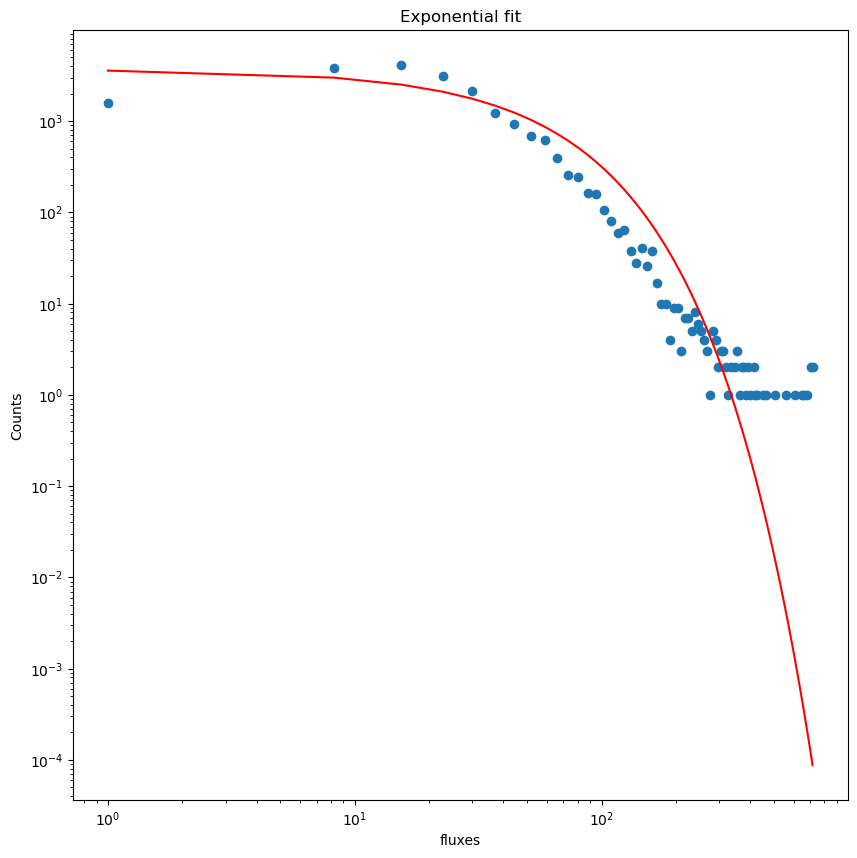

In [ ]:
# FUCNTIONS FOR FITTING
def powerlaw(x, amp, index):
    return amp * (np.array(x)**index)

def exponential(x, amp, index):
    return amp * np.exp(-index*np.array(x))

def quadratic_loss_function(y_predict, y_measured):
    return np.sum((y_predict-y_measured)**2)

def objective_function_powerlaw(params,x,y_measured):
    return quadratic_loss_function(powerlaw(x, params[0], params[1]), y_measured)

def objective_function_exponential(params,x,y_measured):
    return quadratic_loss_function(exponential(x, params[0], params[1]), y_measured)

from scipy.optimize import curve_fit,minimize
from scipy import stats
from scipy.stats import powerlaw as pl
# PRODUCE VECTOR OF FLUXES
mask = fluxes_matrix.flatten()>0
flux_distr = fluxes_matrix.flatten()[mask]
# POWER LAW FIT
initial_guess = [list(n)[2],0.3]
result_powerlaw = minimize(objective_function_powerlaw, (list(n)[0],0.3), args = (bins[:-1], list(n)))
optimal_params_powerlaw = result_powerlaw.x
fit = curve_fit(powerlaw, bins[:-1], list(n),p0 = optimal_params_powerlaw)
print(fit)
print('powerlaw fit: ',fit[0][0],' ',fit[0][1])
print('Convergence fit powerlaw: ',result_powerlaw.success)
print('Optimal parameters: ',result_powerlaw.x)
print('Message: ',result_powerlaw.message)

# EXPONENTIAL FIT
initial_guess = [list(n)[2],0.3]
result_expo = minimize(objective_function_exponential, (list(n)[0],0.3), args = (bins[:-1], list(n)))
optimal_params_expo = result_expo.x
fitexp = curve_fit(exponential, bins[:-1], list(n),p0 = optimal_params_expo)
print(fitexp)
print('expo fit: ',fitexp[0][0],' ',fitexp[0][1])
print('Convergence fit expo: ',result_expo.success)
print('Optimal parameters: ',result_expo.x)
print('Message: ',result_expo.message)

fig,ax = plt.subplots(1,1,figsize=(10,10))
n,bins = np.histogram(flux_distr,bins = 100)
ax.scatter(bins[:-1],n)
plt.plot(bins[:-1],exponential(bins[:-1],fitexp[0][0],fitexp[0][1]),color = 'red')
ax.set_xlabel('fluxes')
ax.set_ylabel('Counts')
ax.set_title('Exponential fit')
ax.set_yscale('log')
ax.set_xscale('log')
plt.show()

# FITTING GRAVITATIONAL FIELD

In [ ]:
from scipy.optimize import curve_fit
def grav_field(mi,mj,d,k,d0):
    return mi*mj*(-k)*np.exp(-d/d0)


In [ ]:
import geopandas as gpd
from shapely.geometry import Point, LineString
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix
def gravitational_field(fluxes_matrix,normalized_vectors,norm_vect):
    mass = np.sum(fluxes_matrix,axis=1)
    grav_vector_field = np.array([np.array([normalized_vectors[i][j]*mass[i]*mass[j]/norm_vect[i][j] for j in range(len(normalized_vectors[0]))]) for i in range(len(normalized_vectors))])    
    grav_vector_field = np.sum(grav_vector_field,axis=1)
    return grav_vector_field
# Sample list of points
fig, ax = plt.subplots(figsize=(10, 10))
point_coords = np.array([np.array(G_centroid.nodes[node]['pos']) for node in G_centroid.nodes() if 'pos' in G_centroid.nodes[node].keys()]) #SHAPE (ncenters,2)

points_3d = point_coords[:, np.newaxis, :]
#dx = point_coords.T[0] - point_coords[:,0]
#dy = point_coords.T[1] - point_coords[:,1]
vectors = point_coords - points_3d #SHAPE (ncenters,ncenters,2)`
norm_vect =  np.linalg.norm(vectors, axis=2)[:, :, np.newaxis] #SHAPE (ncenters,ncenters,1)
nv = np.array([np.array([norm_vect[i][j][0] if norm_vect[i][j][0] != 0 else 1 for j in range(len(norm_vect[i]))]) for i in range(len(norm_vect))]) #SHAPE (ncenters,ncenters)
distance_matrix_ = distance_matrix(point_coords, point_coords)
print(nv-distance_matrix_)

normalized_vectors = [[vectors[i][j] / nv[i][j] for j in range(len(vectors[i]))] for i in range(len(vectors))] #SHAPE (ncenters,ncenters,2)
not_yet_flux_vectors = np.array([np.array([normalized_vectors[i][j]*fluxes_matrix[i][j] for j in range(len(normalized_vectors[0]))]) for i in range(len(normalized_vectors))])
flux_vectors = np.sum(not_yet_flux_vectors,axis=1) #SHAPE (ncenters,2)
mass = np.sum(matrix_out)
#grav_vector_field = gravitational_field(fluxes_matrix,normalized_vectors,nv)
gdf_polygons.plot(ax=ax, color='white', edgecolor='black')
ax.quiver(point_coords[:,0], point_coords[:,1], flux_vectors[:,0] ,flux_vectors[:,1], angles='xy', scale_units='xy',scale = 1000, color='blue')
u, v = flux_vectors.T
# Compute potential values
X,Y = np.meshgrid(point_coords[:,0], point_coords[:,1])
potential = np.cumsum(u) + np.cumsum(v)
#potential = potential.reshape(-1, 1)
print('potential shape: ',np.shape(potential))
sc = ax.scatter(point_coords[:,0], point_coords[:,1], c=potential, cmap='viridis', edgecolors='k', linewidth=0.5, s=10)
# Colorbar for potential values
cbar = plt.colorbar(sc)
cbar.set_label('Potential')
legend = []
n,bins = np.histogram(potential,bins = 10)
#unique_potentials = np.unique(potential)
for b,pot in enumerate(bins):

    mask = [True if p > pot and p < bins[b+1] else False for p in potential]
    if b == len(bins)-1 or b == len(bins)-2:
        ax.plot(point_coords[mask,0], point_coords[mask,1], alpha=0.7)
        legend.append(f'Potential {pot:.2f}')
ax.legend(legend)

#ax.contour(point_coords[:,0], point_coords[:,1], potential.reshape(X.shape), cmap='viridis')
#ax.quiver(point_coords[:,0], point_coords[:,1], grav_vector_field[:,0] ,grav_vector_field[:,1], angles='xy', scale_units='xy',scale = 1, color='red')
#ax.set_xlable('longitude')
#ax.set_ylable('latitude')
ax.set_title('Vector Field between Centroids polygons')
plt.show()


<AxesSubplot: >

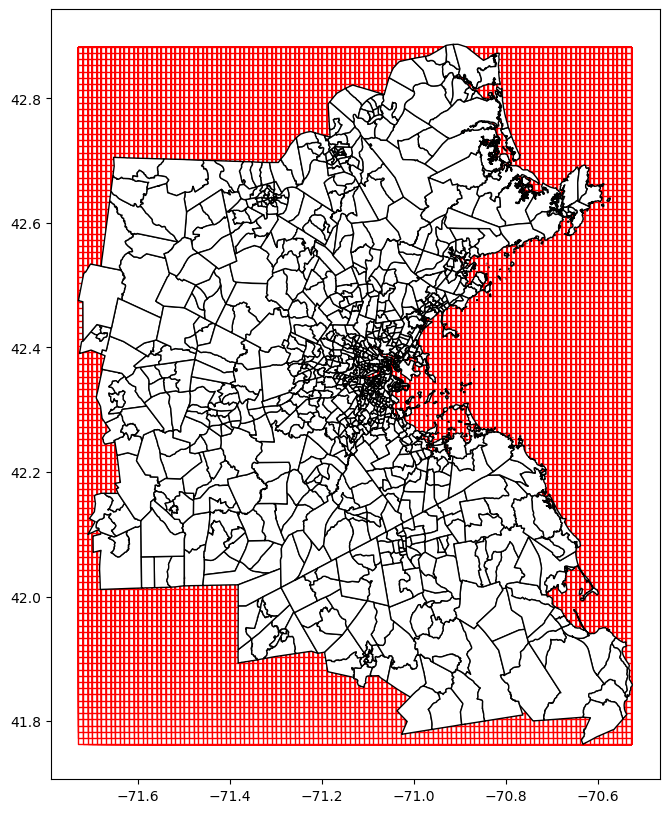

In [ ]:
grid_size = 0.01 
centroid = gdf_polygons.geometry.unary_union.centroid
bounding_box = gdf_polygons.geometry.unary_union.bounds
bbox = shp.geometry.box(*bounding_box)
bbox_gdf = gpd.GeoDataFrame(geometry=[bbox], crs=gdf_polygons.crs)

x = np.arange(bounding_box[0], bounding_box[2], grid_size)
y = np.arange(bounding_box[1], bounding_box[3], grid_size)
grid_points = gpd.GeoDataFrame(geometry=[shp.geometry.box(xi, yi,maxx = max(x),maxy = max(y)) for xi in x for yi in y], crs=gdf_polygons.crs)
ij = [[i,j] for i in range(len(x)) for j in range(len(y))]
grid_points['i'] = np.array(ij)[:,0]
grid_points['j'] = np.array(ij)[:,1]
# Clip the grid to the bounding box
grid = gpd.overlay(grid_points, bbox_gdf, how='intersection')
idx2grid = {idx:grid for idx,grid in enumerate(grid)}
fig,ax = plt.subplots(1,1,figsize = (10,10))
grid.plot(ax=ax, color='white', alpha=1,edgecolor = 'red')
gdf_polygons.plot(ax=ax, color='white',alpha = 1, edgecolor='black')


In [ ]:
import time
import multiprocessing as mp
#grid_with_indices = gpd.overlay(grid_points, bbox_gdf, how='identity')
#grid.plot(color='white', alpha=1,edgecolor = 'black')
print('total number hexagon with population: ',len(gdf_hexagons.loc[gdf_hexagons['population'] > 0]))
print('number of polygons: ',len(gdf_polygons))
polygon_sindex = gdf_polygons.sindex
populationpolygon = np.zeros(len(gdf_polygons))
for idxh,hex in gdf_hexagons.loc[gdf_hexagons['population'] > 0].iterrows():
    t0 = time.time()    
    possible_matches_index = list(polygon_sindex.intersection(hex.geometry.bounds))
    possible_matches = gdf_polygons.iloc[possible_matches_index]
        
    # Filter based on actual intersection
    if len(possible_matches) > 0:
        intersecting = possible_matches[possible_matches.geometry.intersects(hex.geometry)]
        for idxint,int_ in intersecting.iterrows():
            populationpolygon[idxint] += hex.population*int_.geometry.intersection(hex.geometry).area/hex.geometry.area        
            if int_.geometry.intersection(hex.geometry).area/hex.geometry.area>1.01:
                raise ValueError('Error the area of the intersection is greater than 1: ',int_.geometry.intersection(hex.geometry).area/hex.geometry.area)
    else:
        pass
    t1 = time.time()

    print('Checking one hexagon time: ',t1-t0)
    gdf_polygons['population'] = populationpolygon
gdf_polygons.plot(column='population',legend=True)
#bbox_gdf.plot()

[]

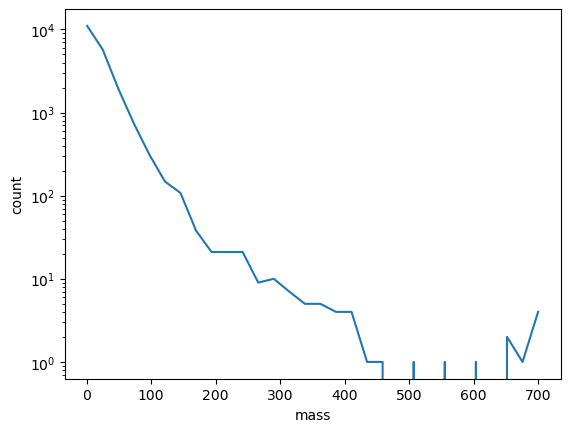

In [ ]:
# FITTING THE GRAVITATIONAL MODEL
mask = [True if m>0 else False for m in matrix_out]
n,bins = np.histogram(matrix_out[mask],bins = 30)
plt.plot(bins[:-1],n)
plt.xlabel('mass')
plt.ylabel('count')
plt.semilogy()

In [ ]:


R = 10
theta = np.linspace(0,2*np.pi,1000)
r = np.linspace(0,R,1000)
def gradient_field(R,theta,d0,r0):
    r*(-1 +d0/r + d0*r0*np.cos(theta)/r**2)*(1-np.cos(theta)/d0)*np.exp(+r/d0)
    return (R**2 + 1)/(R**2 + 1 - 2*R*np.cos(theta))
for r_ in r:
    for theta_ in theta:
        gradient_field(R,theta_,d0,r0)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
NBlocks = 10 # number of blocks
LSquareGrid = 1 # km
AreaGrid = LSquareGrid**2 # km^2
rho = 100 # people per km^2
M = NBlocks*rho*AreaGrid # number of people
m = np.random.rand(NBlocks)
m = np.ones((NBlocks,NBlocks))
def gravitational_field(mi,mj,dij,k,d0):
    return mi*mj*(-k)*np.exp(-dij/d0)
vectorgrid = []
for i in range(NBlocks):
    for j in range(NBlocks):
        if i<=j:
            for i1 in range(NBlocks):
                for j1 in range(NBlocks):
                    if i<=i1 and j<=j1:
#                        print('i: ',i,' j: ',j,' i1: ',i1,' j1: ',j1)
                        vectorgrid.append([(i1 -i)*LSquareGrid,(j1-j)*LSquareGrid])
vectorgrid = np.array(vectorgrid)
x = np.arange(NBlocks)
y = np.arange(NBlocks)
X,Y = np.meshgrid(x,y)
print(X,'\t',Y)
plt.quiver(X,Y,vectorgrid)
print(vectorgrid,len(vectorgrid),' = 1')




In [ ]:
import pandas as pd
import os
import matplotlib.pyplot as plt

def second2hour(seconds_in_day):
    '''
        Output:
            Vector of 24 values containing each hour in second unit
    '''
    hour_in_day = [sec for sec in seconds_in_day if sec%3600 == 0]
    return hour_in_day

def in_net_people_time(df_people,save_dir,name,hour_in_day=24,minutes_in_hour=60,seconds_in_minute=60,interval_in_minutes = 15):
    '''
        Shows the unloading of the graph on time
    '''
    number_people_staying = []
    interval_minutes = hour_in_day*minutes_in_hour*interval_in_minutes
    seconds_per_day = hour_in_day*minutes_in_hour*seconds_in_minute
    interval15 = np.linspace(0,seconds_per_day,interval_minutes) # Spits intervals of seconds every 15 minutes [0,900,...,]
    time_exit = df_people['time_departure'].to_numpy() + np.sum(df_people['travel_time'].to_numpy(),axis = 1)
    df_people['time_exit'] = time_exit
    for interval in interval15:
        number_people_staying.append(len(np.where(df_people['time_exit'].to_numpy()<interval))) 
    fig,ax = plt.subplots(1,1,figsize = (15,15))
    ax.scatter(interval15,number_people_staying)
    ax.set_xlabel('time')
    ax.set_ylabel('Number people in graph')
    plt.savefig(os.path.join(save_dir,name)+'.png',dpi = 200)
    plt.show()



if __name__=='__main__':
    output_dir = '/home/aamad/Desktop/phd/berkeley/data/BOS/R_1/'
    for file in os.listdir(output_dir):
        if 'people' in file:
            print('file: ',os.path.join(output_dir,file))
            df_people = pd.read_csv(os.path.join(output_dir,file))
            name = 'unloading_'+file
            in_net_people_time(df_people,output_dir,name)

        elif 'route' in file:
            print('file: ',os.path.join(output_dir,file))
            with open(os.path.join(output_dir,file)) as f:
                lines = f.readlines()
                print('number of lines: ',len(lines))
                print('first line: ',lines[0])
                print('last line: ',lines[-1])
                print('number of people: ',len(lines)-1)
#            df_people = pd.read_csv(os.path.join(output_dir,file),',')


In [ ]:
time_interval = 1
divisions = 1000
dt = np.linspace(0,time_interval,divisions)
Wiener_field = np.random.normal(0,1,(3,divisions))
covariance_matrix = np.array([[1,0,0],[0,1,0],[0,0,1]])


[]

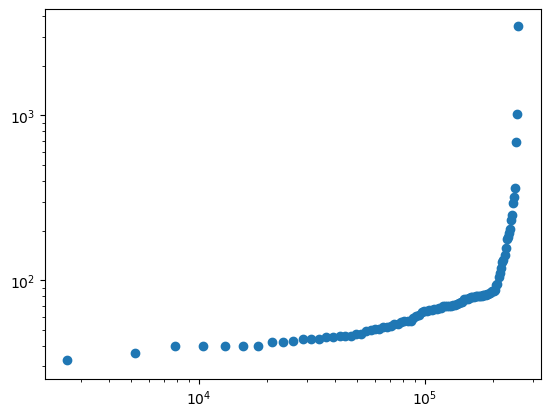

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
gdf = gpd.read_file('/home/aamad/Desktop/phd/berkeley/data/carto/BOS/grid/grid_size_0.01.geojson')
n,bins = np.histogram(gdf.population,bins = 100)
n1 = np.sort(n)

plt.scatter(bins[:-1],n1)
plt.loglog()

# COUNT PEOPLE COVID

Number of hexagons:  14476
Total population:  7384322.0
resolution:  8
Number of hexagons:  9793
Total population:  4547161.0
resolution:  8
gdf_polygons:  EPSG:4326
Number of hexagons:  7578
Total population:  9982177.0
resolution:  8
CityName:  LIS
                h3  population  \
0  883933bb37fffff       172.0   
1  883933bb33fffff         1.0   
2  883933b9edfffff       232.0   
3  883933b9ebfffff        60.0   
4  883933b9e9fffff        55.0   

                                            geometry  
0  POLYGON ((-9.40020 39.37197, -9.40598 39.36982...  
1  POLYGON ((-9.39396 39.37920, -9.39974 39.37705...  
2  POLYGON ((-9.35376 39.33043, -9.35954 39.32828...  
3  POLYGON ((-9.33644 39.33688, -9.34221 39.33473...  
4  POLYGON ((-9.34752 39.33765, -9.35330 39.33550...  
EPSG:4326
Length Gpkg:  88728
Upload Gpkg:  7.681116104125977
Number of hexagons:  18230
Total population:  3770078.0
resolution:  8
CityName:  RIO
                h3  population  \
0  88c2dbdb67fffff         1.0  

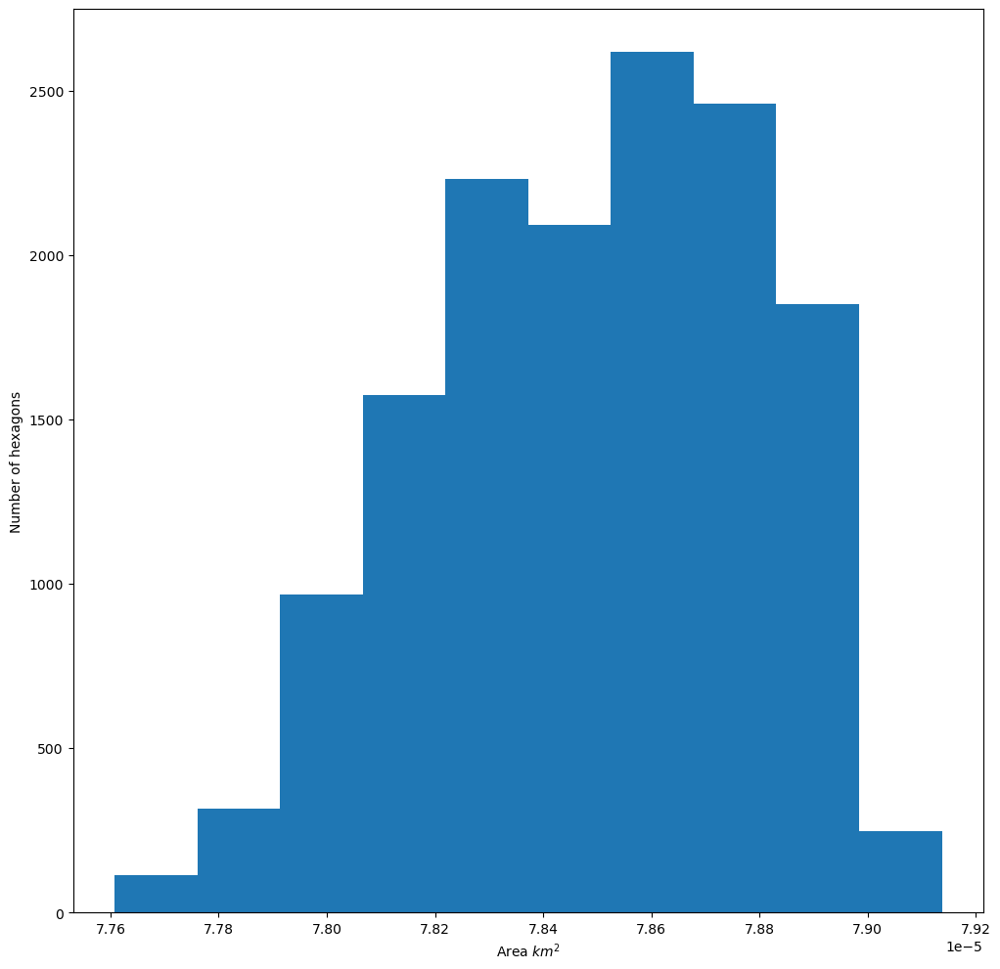

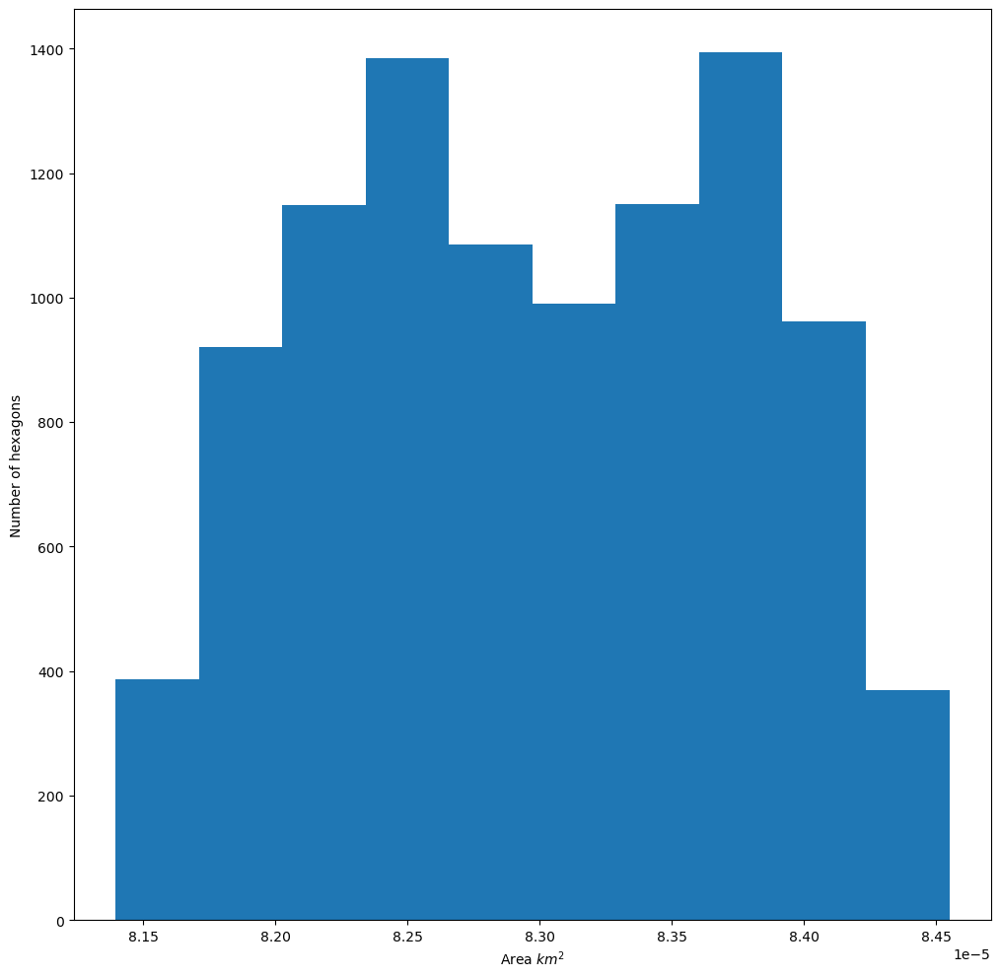

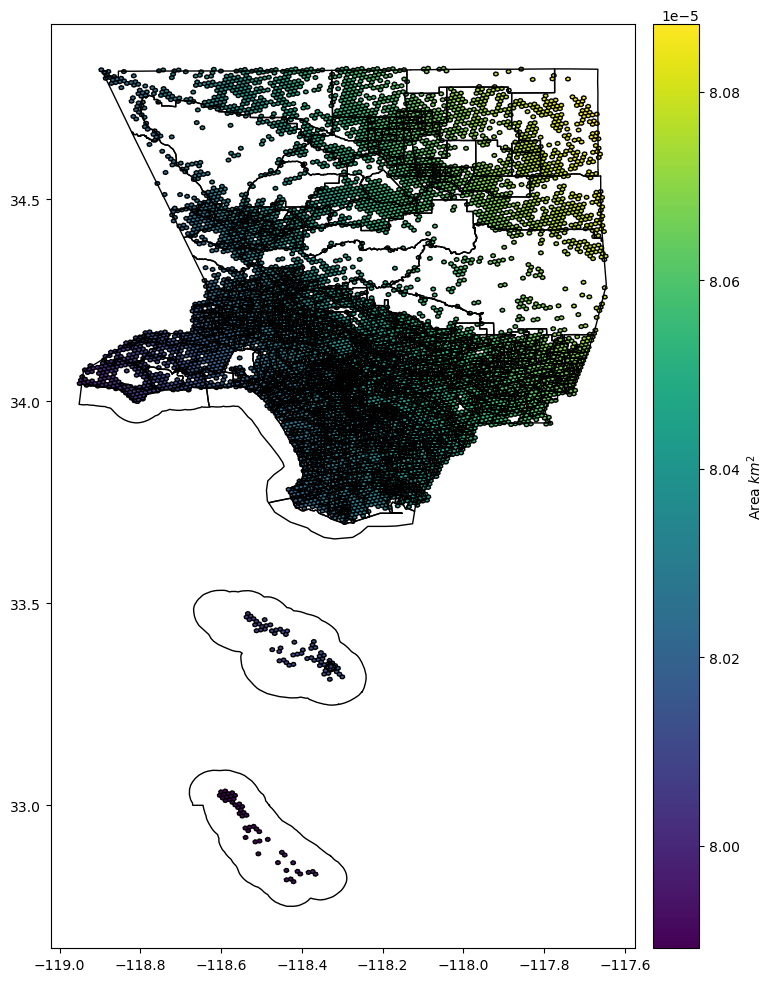

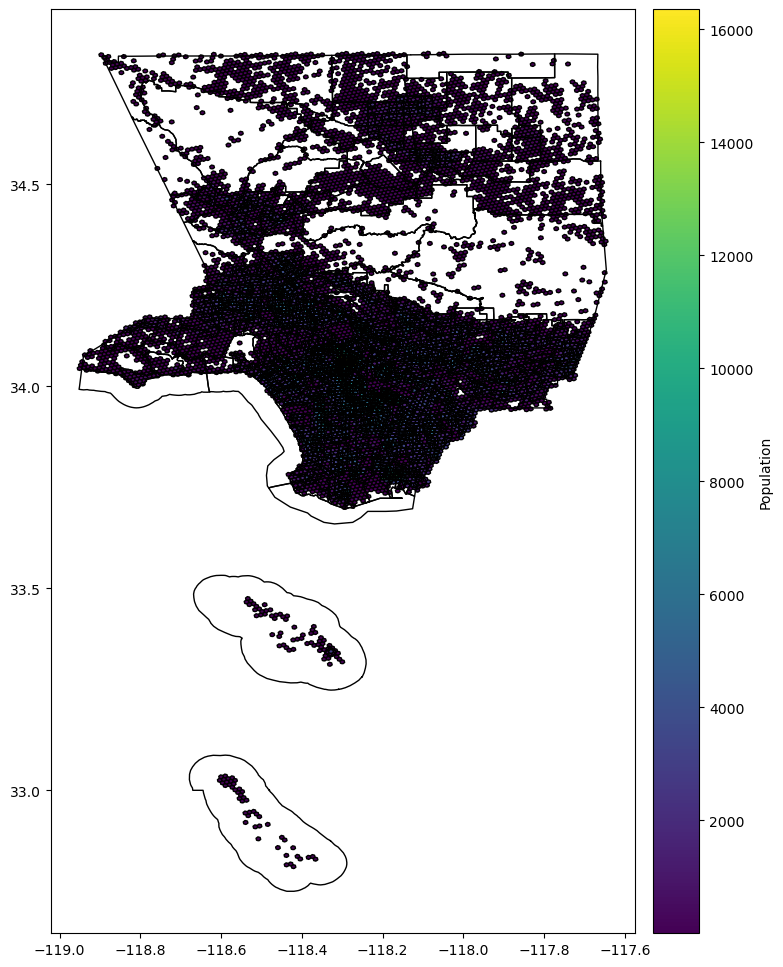

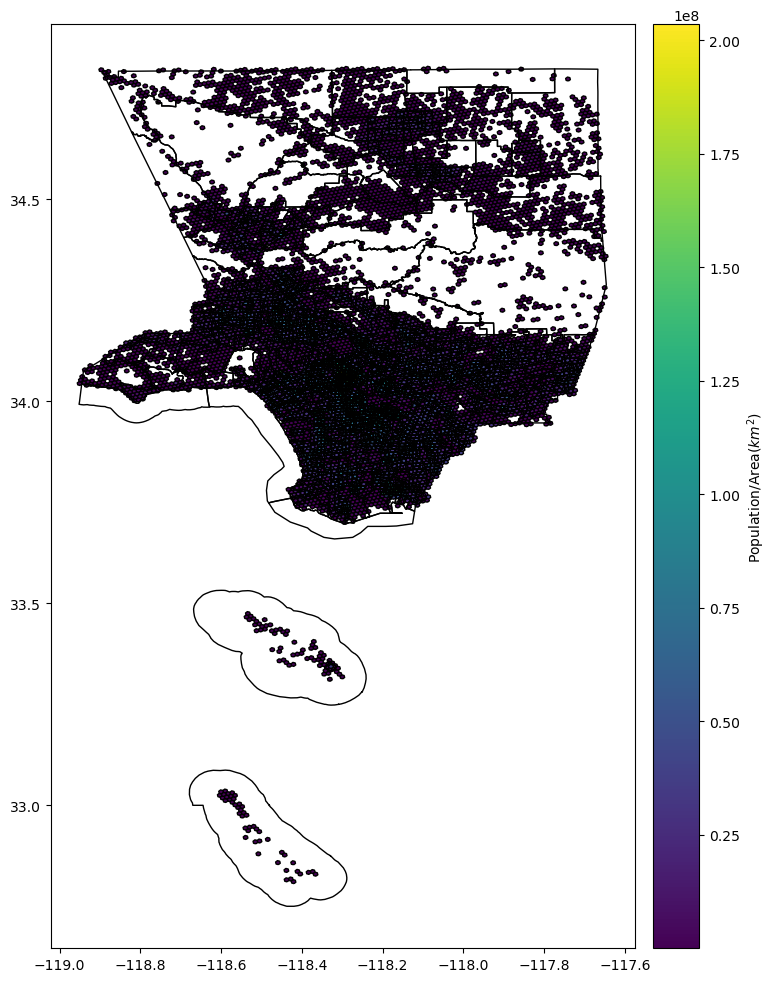

...

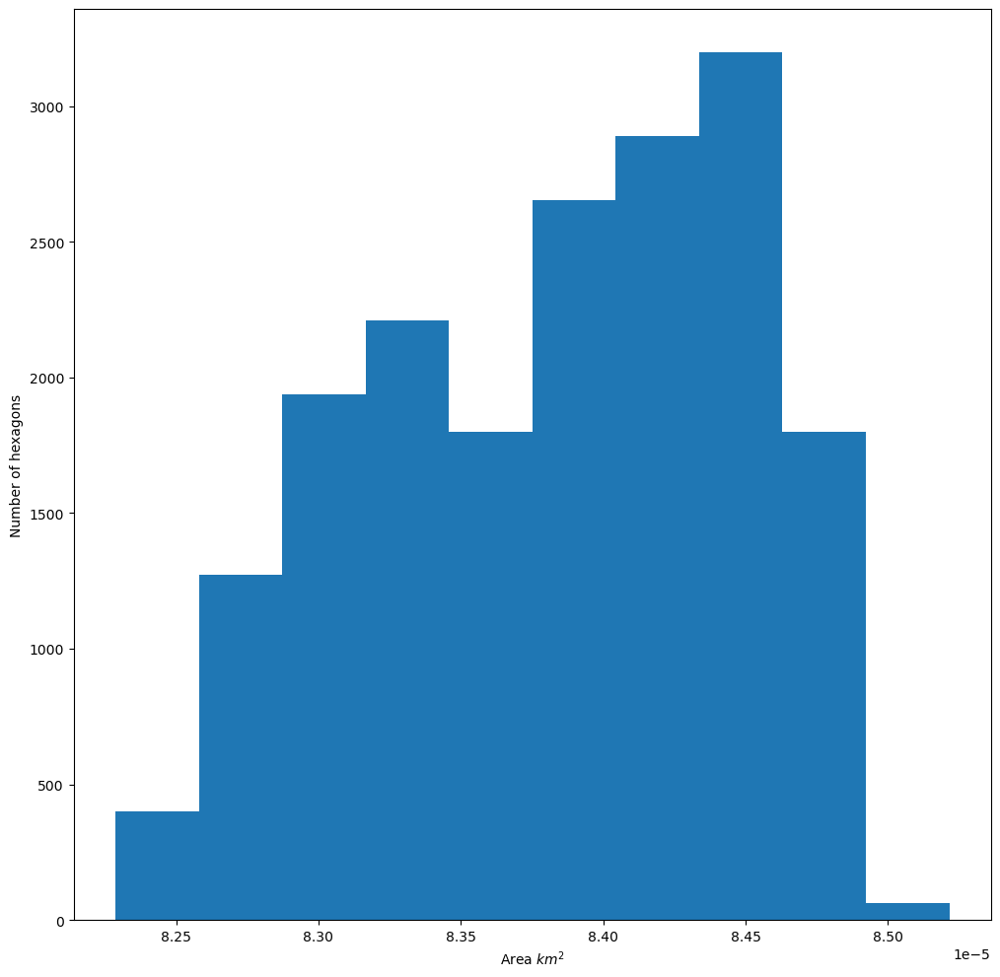

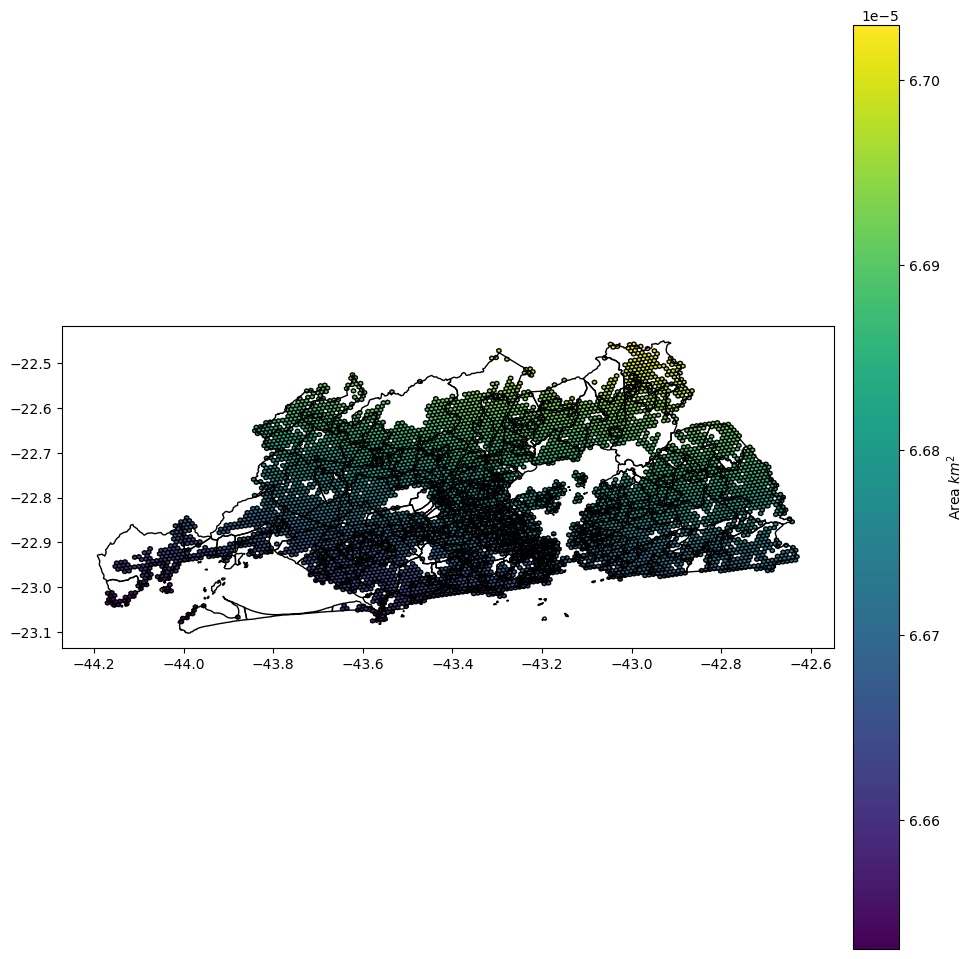

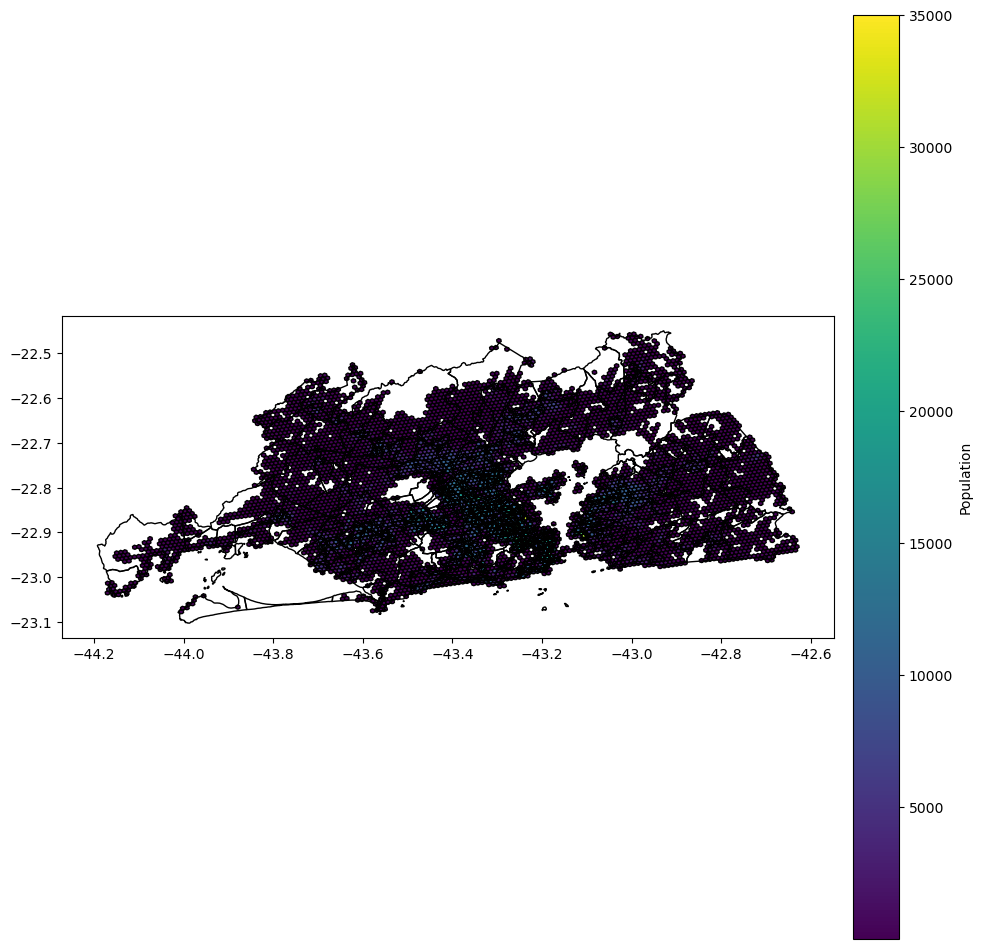

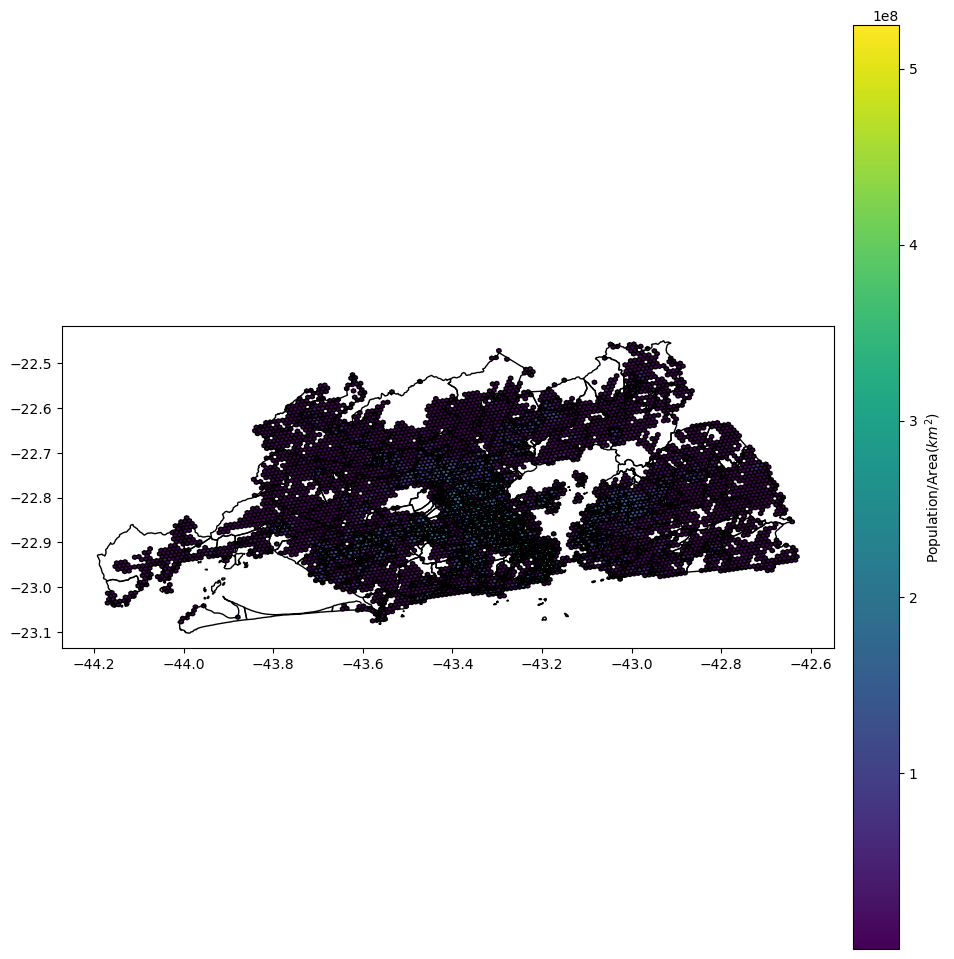

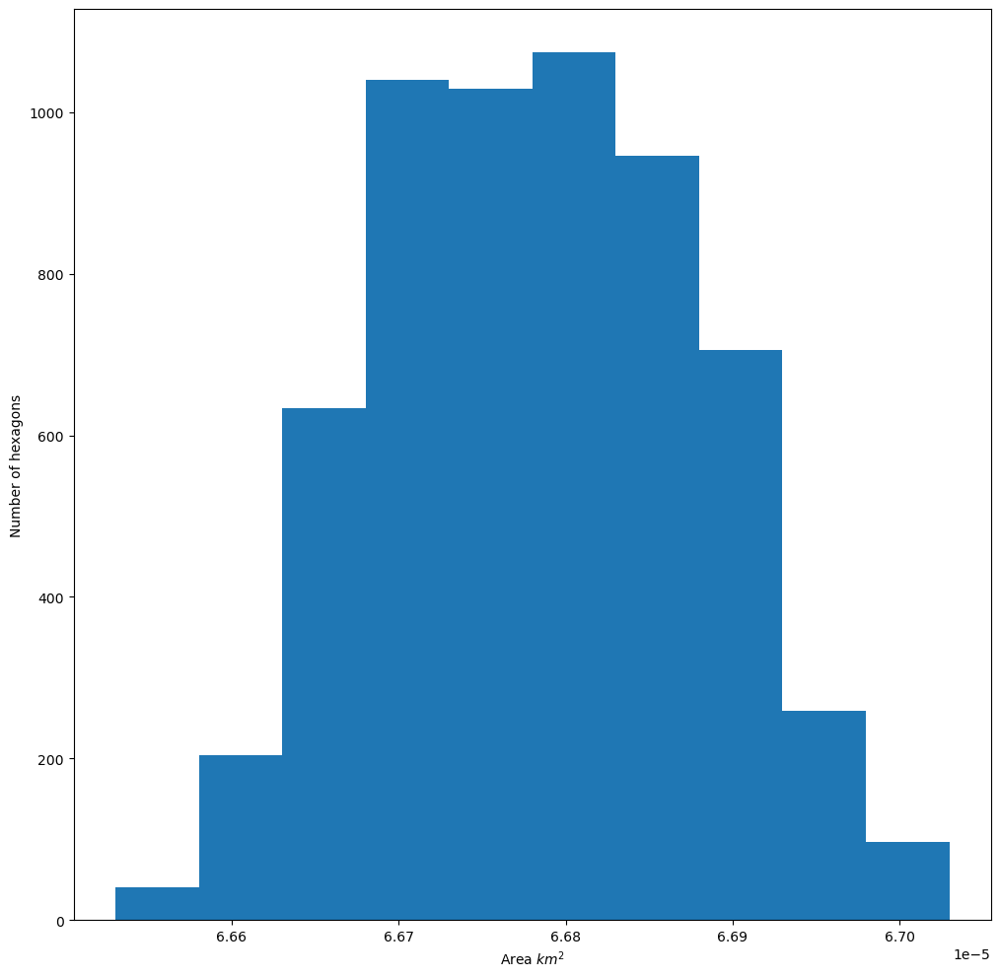

In [10]:
'''
I need to add people that are taken from the area of interest and not over all US
'''
import geopandas as gpd
import os
import zipfile
import gzip 
import shutil
import h3
from shapely.geometry import Polygon
import sys
sys.path.append('/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/scripts/PreProcessing')
from plot import *
import matplotlib.pyplot as plt
import time
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

CityNames = ['SFO','BOS','LAX','LIS','RIO']
gpkg_file_dir = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/tiff_files/'

save_dir_local = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/'

def convert_resolution(h3_idx, h3_idxresolution):
    return h3.h3_to_children(h3_idx, h3_idxresolution)
def ReadGpkg(gpkg_file_dir,CityName):
    City2FileZip = {'SFO':'kontur_population_US_20231101.gpkg.gz','BOS':'kontur_population_US_20231101.gpkg.gz','LAX':'kontur_population_US_20231101.gpkg.gz','LIS':'kontur_population_PT_20231101.gpkg.gz','RIO':'kontur_population_BR_20231101.gpkg.gz'} 
    City2FileUnZip = {'SFO':'kontur_population_US_20231101.gpkg','BOS':'kontur_population_US_20231101.gpkg','LAX':'kontur_population_US_20231101.gpkg','LIS':'kontur_population_PT_20231101.gpkg','RIO':'kontur_population_BR_20231101.gpkg'}
    if not os.path.isfile(os.path.join(gpkg_file_dir,City2FileUnZip[CityName])):
        with gzip.open(os.path.join(gpkg_file_dir,City2FileZip[CityName]), 'rb') as f_in:
            with open(os.path.join(gpkg_file_dir,City2FileUnZip[CityName]), 'wb') as f_out:
                shutil.copyfileobj(f_in, f_out)
    else:
        pass
    USGeoDataFrame = gpd.read_file(os.path.join(gpkg_file_dir,City2FileUnZip[CityName]))
    USGeoDataFrame['geometry'] = USGeoDataFrame['h3'].apply(lambda x: Polygon(h3.h3_to_geo_boundary(x,True)))
    USGeoDataFrame.crs = "EPSG:4326"
    print(USGeoDataFrame.head())
    print(USGeoDataFrame.crs)
#    USGeoDataFrame.to_crs("EPSG:4326", inplace=True)
    return USGeoDataFrame
def ChangeResolutionExtractPopulation(population,hex_id,resolution):
    print('hex resolution: ',h3.h3_get_resolution(hex_id))
    print('resolution: ',resolution)
    polygons = Polygon(h3.h3_to_geo_boundary(hex_id, resolution))
    print('polygons: ',polygons)
    exponent = (resolution - h3.h3_get_resolution(hex_id))
    
    return polygons,list(population*7**exponent)*len(polygons)

def HexagonFromGpkg(USGeoDataFrame,gdf_polygons,resolution=8):
    if gdf_polygons.crs != "EPSG:4326":
        gdf_polygons.crs = "EPSG:4326"
        print('gdf_polygons: ',gdf_polygons.crs)
    gdf_hexagons = USGeoDataFrame[USGeoDataFrame.geometry.intersects(gdf_polygons.unary_union)]
#    hexagons = intersecting_hexagons.apply(lambda row: h3.polyfill(row.geometry.__geo_interface__,resolution),axis = 1).explode()
#    print(hexagons)
#    geom,population= zip(*intersecting_hexagons.apply(lambda row: ChangeResolutionExtractPopulation(row['population'],row['h3'],resolution),axis = 1).explode())
 #   gdf_hexagons = gpd.GeoDataFrame(geometry=geom, data=population, columns=['population'])
#    gdf_hexagons['population'] = intersecting_hexagons.apply(lambda row: ChangeResolutionExtractPopulation(row['population'],hex_id['h3'],resolution)) 
#    gdf_hexagons = gdf_hexagons.plot()
#    gdf_hexagons = gpd.GeoDataFrame(gdf_hexagons, geometry='geometry', crs= USGeoDataFrame.crs)    
    resolution = h3.h3_get_resolution(gdf_hexagons['h3'].tolist()[0])
    area = gdf_hexagons['geometry'].apply(lambda x: x.area)
    gdf_hexagons['area'] = area
    del area
    idx = gdf_hexagons.index
    gdf_hexagons['index'] = idx
    del idx
    centroid =gdf_hexagons['geometry'].apply(lambda x: x.centroid)
    gdf_hexagons['centroid_x'] = centroid.x
    gdf_hexagons['centroid_y'] = centroid.y
    del centroid
    density = gdf_hexagons.apply(lambda x: x['population']/x['area'],axis = 1)
    gdf_hexagons['density_population'] = density
    del density 
    return gdf_hexagons,resolution
for CityName in CityNames:
    if CityName == 'BOS' or CityName == 'LAX' or CityName == 'SFO':
        pass
    else:
        print('CityName: ',CityName)
        t0 = time.time()
        GpkgDataFrame = ReadGpkg(gpkg_file_dir,CityName)
        print('Length Gpkg: ',len(GpkgDataFrame))
        t1 = time.time()
        print('Upload Gpkg: ',t1-t0)
    gdf_polygons = gpd.read_file('/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/{0}/shape_files/{1}.shp'.format(CityName,CityName))
    gdf_hexagons,resolution = HexagonFromGpkg(GpkgDataFrame,gdf_polygons)
    print('Number of hexagons: ',len(gdf_hexagons))
    print('Total population: ',np.sum(gdf_hexagons['population']))
    print('resolution: ',resolution)
    plot_dir = os.path.join(save_dir_local,CityName)
    geojson_dir = os.path.join(plot_dir,'hexagon',str(resolution))
    gdf_hexagons.to_file(os.path.join(geojson_dir,'hexagon.geojson'), driver="GeoJSON")
    plot_hexagon_tiling(gdf_hexagons,gdf_polygons,plot_dir,str(resolution))



In [ ]:
import matplotlib.pyplot as plt
gdf_polygons = gpd.read_file('/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/carto/BOS/shape_files/BOS.shp')
gdf_hexagon = gpd.overlay(gdf, gdf_polygons, how='intersection')
fig,ax = plt.subplots(1,1,figsize=(20,20))
gdf_polygons.boundary.plot(ax = ax,alpha = 0.2,color = 'black')
ConvertedGdf.loc[:,('population','geometry')].plot(ax=ax, column='population',legend=True,alpha = 0.6,cmap = 'inferno')
ax.axis('off')
ax.set_title('BOS Population')
plt.show()
#data_us_dissolved = gdf_hexagon.dissolve(by='granularity', aggfunc='sum')

In [ ]:
plt.hist(gdf_hexagon.area)

In [ ]:
import matplotlib.pyplot as plt
R = 100 # Is the linear radius considered for the city. The overall space
number_intervals = 1000
r = np.linspace(0,R,number_intervals)
dr = R/number_intervals # When number intervals goes to infinity this is the infinitesimal length of the interval
r0 = 0
r1 = 50
r2 = 80
rc0 = 20
rc1 = 20
rc2 = 20

def expo_distr(x,ri,rci,R):
    '''
    This outputs exactly the length of the interval of x is summed over. So it is P(x)dx
    '''
    return np.exp(-np.abs(x-ri)/rci)/(rci)

print(expo_distr(x,r0,rc0,R))
print(np.sum(expo_distr(x,r0,rc0,R)))
P = (expo_distr(r,r0,rc0,R) + expo_distr(r,r1,rc1,R) + expo_distr(r,r2,rc2,R))
plt.plot(r,expo_distr(r,r0,rc0,R))
plt.plot(r,expo_distr(r,r1,rc1,R))
plt.plot(r,expo_distr(r,r2,rc2,R))
plt.plot(r,P)
plt.legend(['{}'.format(r0),'{}'.format(r1),'{}'.format(r2),'sum'])

def compute_direction_vector_among_points(centers):
    '''
        Computes the unit vector among centers that goes from i to j
    '''
    x_ij = np.zeros(shape = (len(centers),len(centers)))
    d_ij = sp.spatial.distance_matrix(centers,centers)
    for i in range(len(centers)):
        for j in range(len(centers)):
            if j>i:
                x_ij[i,j] = centers[i]-centers[j]
                x_ij[j,i] = -x_ij[i,j]
    return x_ij,d_ij


def compute_max_population(centers,rc,number_house_centers,avg_population_house = 4,percentage_circle = 0.8):
    '''
        Input:
            centers: np.array([x,y])
            rc: float
        Output:
            max_population: float
        Description:
        I want an upper bound for the population in the circle of radius rc centered in center.
            - Given rc and number_of_house_centers I have that I can compute the number of hose centers that
            can fall in the circle of radius 0.1 km centered in center. I consider that the average population in 
            an house is 4. The houses are distributed homogenously and occupy 80% of the circle. This may vary from place to place.

    '''
    if len(centers) == 1:

    else:
                                   
    return False


In [1]:
!pip install ipfn

In [4]:
import numpy as np
from ipfn import ipfn

m = [[40, 30, 20, 10], [35, 50, 100, 75], [30, 80, 70, 120], [20, 30, 40, 50]]
print(np.sum(m,axis = 0))
print(np.sum(m,axis = 1))
m = np.array(m)
xip = np.array([150, 300, 400, 150])
xpj = np.array([200, 300, 400, 100])

aggregates = [xip, xpj]
dimensions = [[0], [1]]

IPF = ipfn.ipfn(m, aggregates, dimensions, convergence_rate=1e-6)
m = IPF.iteration()
print(np.sum(m,axis = 0))
print(np.sum(m,axis = 1))

[125 190 230 255]
[100 260 300 140]
[200. 300. 400. 100.]
[150.00004282 299.99998284 399.99997746 149.99999688]


In [4]:
import dis

with open('/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/scripts/GenerationNet/__pycache__/global_functions.cpython-311.pyc', 'rb') as file:
    code = file.read()
try:
    dis.dis(code)
except IndexError as e:
    print(e)

    >>    0 <167>                   13
    >>    2 <13>
    >>    4 <0>
    >>    6 <0>
          8 <181>                  241
    >>   10 JUMP_IF_NOT_EXC_MATCH   101
         12 <210>                   15
         14 <0>
         16 <227>                    0
         18 <0>
         20 <0>
    >>   22 <0>
    >>   24 <0>
         26 <0>
         28 <0>
         30 <0>
    >>   32 <0>
    >>   34 <0>
    >>   36 <0>
         38 <88>
         40 <0>
         42 <151>                    0
    >>   44 LOAD_CONST               0 (0)
    >>   46 LOAD_CONST               1 (1)
    >>   48 IMPORT_NAME              0 (0)
    >>   50 STORE_NAME               0 (0)
    >>   52 LOAD_CONST               0 (0)
         54 LOAD_CONST               1 (1)
    >>   56 IMPORT_NAME              1 (1)
    >>   58 STORE_NAME               2 (2)
         60 LOAD_CONST               0 (0)
    >>   62 LOAD_CONST               1 (1)
         64 IMPORT_NAME              3 (3)
         66 STORE_NAME            

2147483647